In [1]:
import os
import tqdm
import pickle
import random
import warnings
warnings.filterwarnings("ignore")
from datetime import timedelta

### Data Wrangling ###
import numpy as np
import pandas as pd

### Data Visualization ###
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import timedelta

In [2]:
data=pd.read_csv('Train.csv')
data.head(3).append(data.tail(3))

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
0,2012-10-02 09:00:00,None,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
1,2012-10-02 10:00:00,None,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2,2012-10-02 11:00:00,None,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
38560,2017-11-01 19:00:00,None,274.62,0.0,0.0,90,Mist,mist,3045
38561,2017-11-01 19:00:00,None,274.62,0.0,0.0,90,Rain,light rain,3045
38562,2017-11-01 20:00:00,None,274.75,0.0,0.0,90,Drizzle,light intensity drizzle,2704


DATA IS FROM   2012-10-02   TO   2017-11-01

#
<h1>Exploratory data analysis


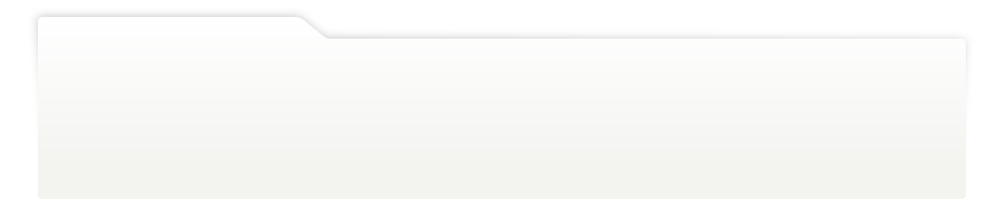
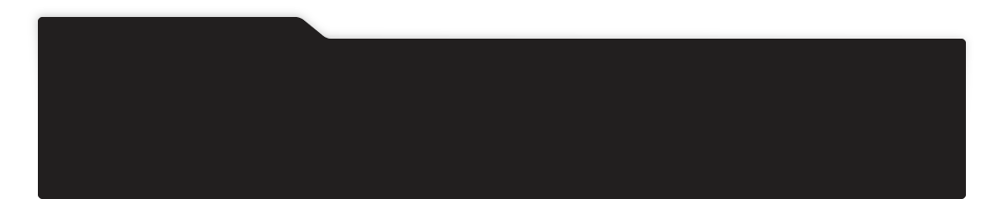
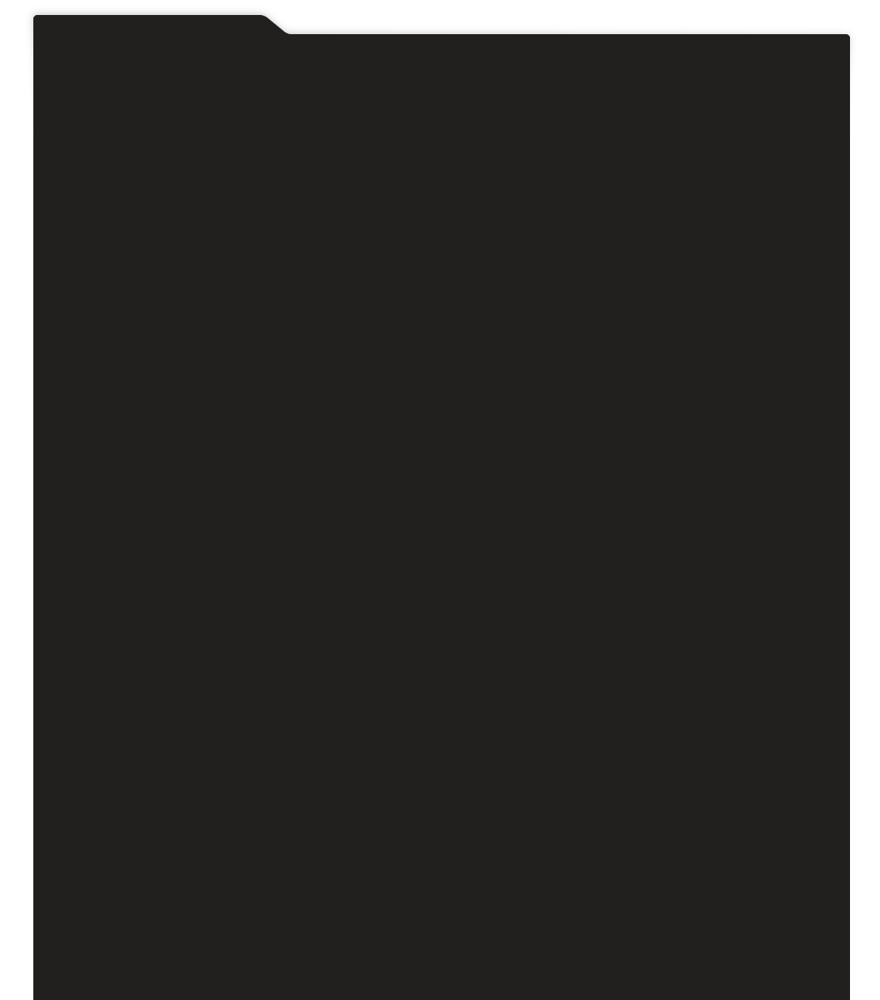
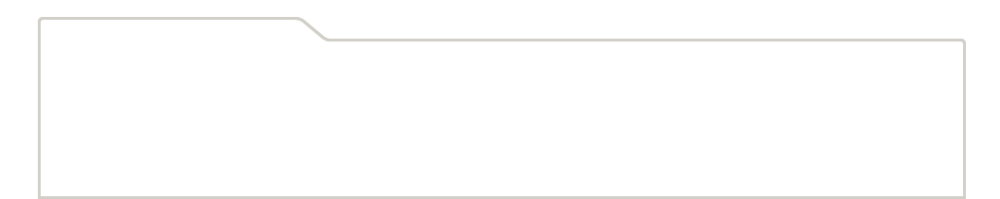
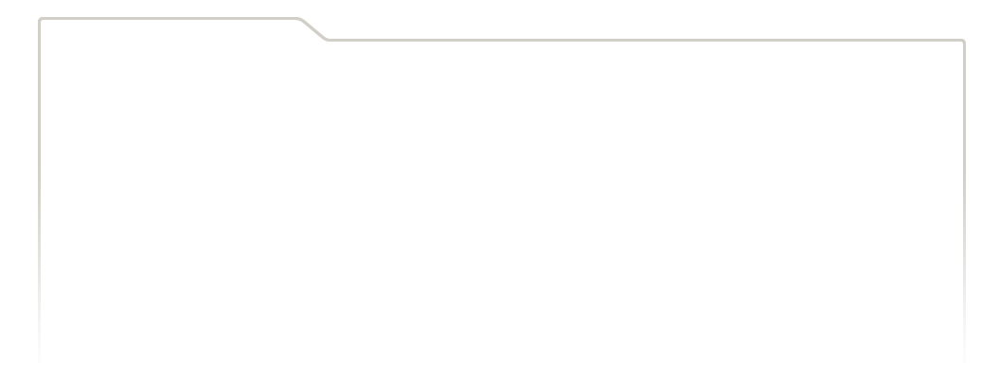
...
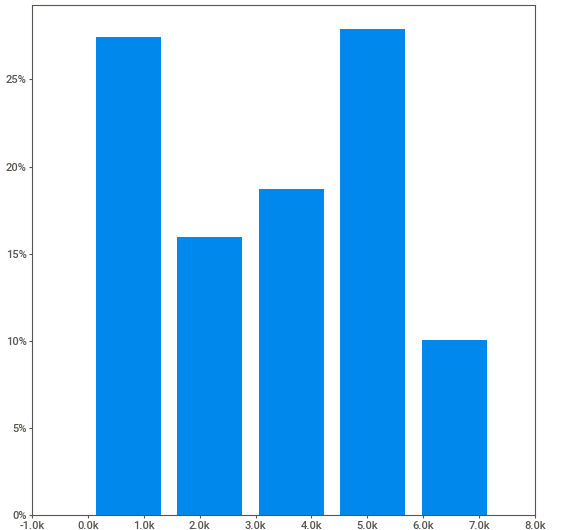
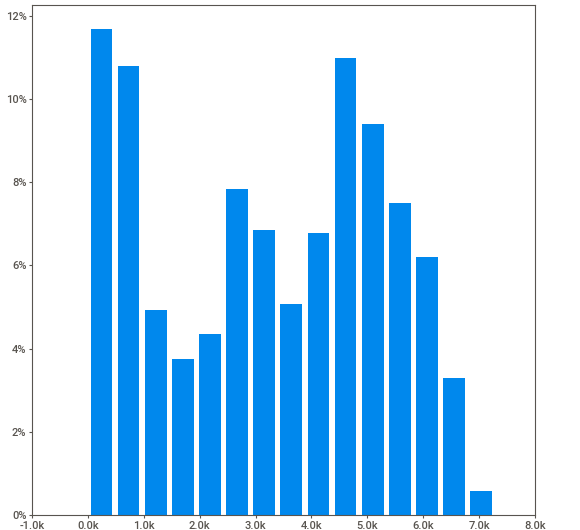
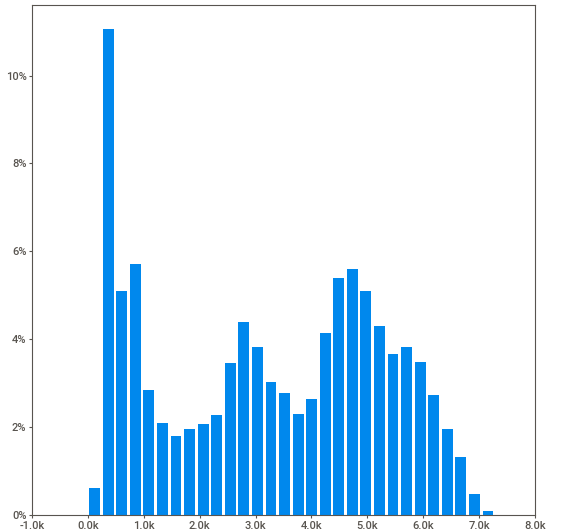
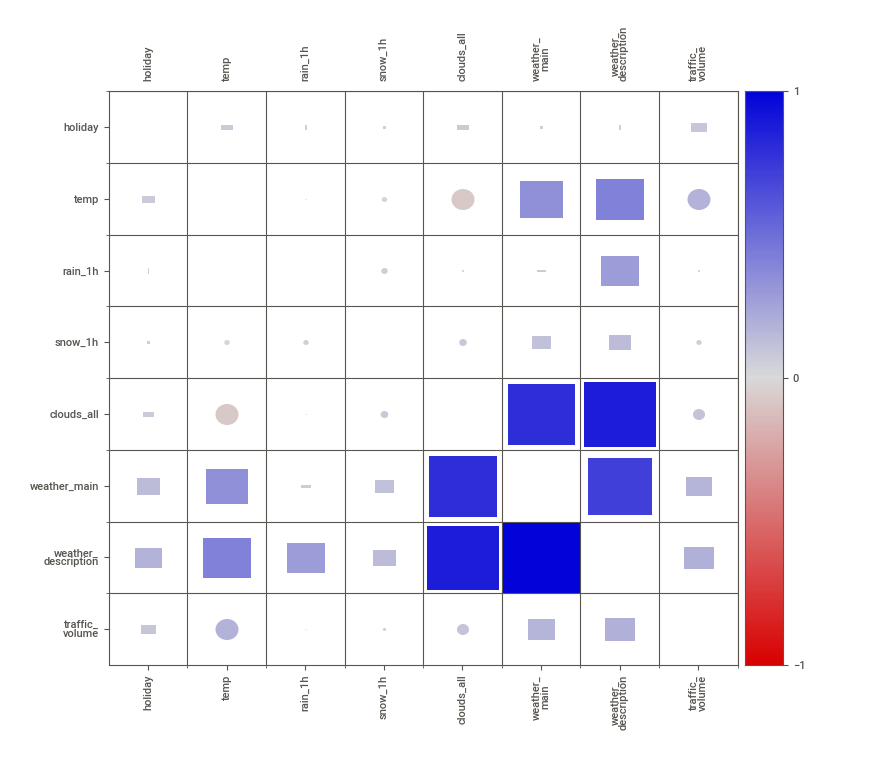
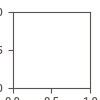

In [4]:
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_notebook()

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38563 entries, 0 to 38562
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date_time            38563 non-null  object 
 1   holiday              38563 non-null  object 
 2   temp                 38563 non-null  float64
 3   rain_1h              38563 non-null  float64
 4   snow_1h              38563 non-null  float64
 5   clouds_all           38563 non-null  int64  
 6   weather_main         38563 non-null  object 
 7   weather_description  38563 non-null  object 
 8   traffic_volume       38563 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 2.6+ MB


In [68]:
data['date_time']=pd.to_datetime(data['date_time'])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38563 entries, 0 to 38562
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date_time            38563 non-null  datetime64[ns]
 1   holiday              38563 non-null  object        
 2   temp                 38563 non-null  float64       
 3   rain_1h              38563 non-null  float64       
 4   snow_1h              38563 non-null  float64       
 5   clouds_all           38563 non-null  int64         
 6   weather_main         38563 non-null  object        
 7   weather_description  38563 non-null  object        
 8   traffic_volume       38563 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(3)
memory usage: 2.6+ MB


In [69]:
print(data['date_time'].min(),data['date_time'].max())

2012-10-02 09:00:00 2017-11-01 20:00:00


 we are having data in the span of 6 years

In [70]:
data.shape

(38563, 9)

<AxesSubplot:xlabel='traffic_volume', ylabel='Density'>

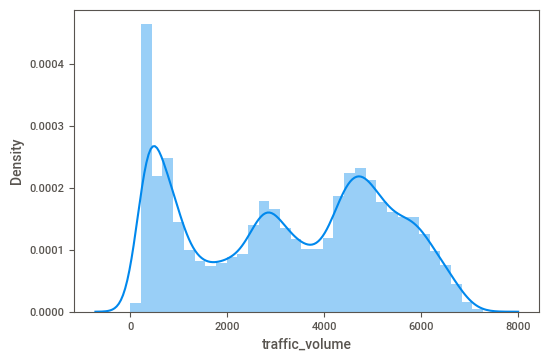

In [9]:
sns.distplot(data['traffic_volume'],kde=True)

from the above dist plot we can observe that the data is not normally distributed, so we have to Sandardize it for training

In [10]:
import datetime

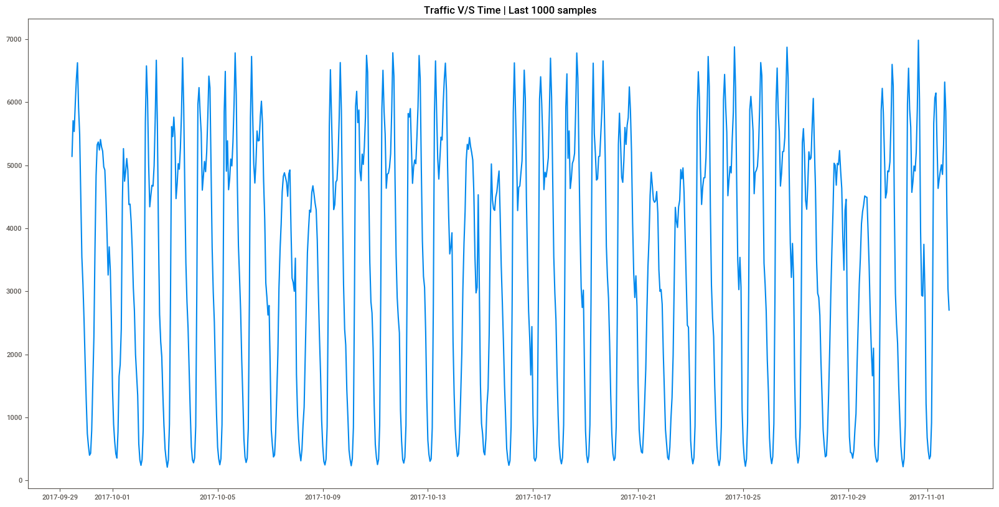

In [13]:
fig, ax = plt.subplots(figsize=(20,10))
last = 1000
sns.lineplot(x=data['date_time'].values[-last:],y=data['traffic_volume'].values[-last:])
plt.title(f'Traffic V/S Time | Last {last} samples')
plt.show()

from the Last few samples we can observe a that there are a lot of fluctuations in traffic volume with respect to time

In [12]:
data['holiday'].nunique()

12

Lets plot some regression plots to understand how features are behaving with respect to traffic volume

Text(0.5, 1.0, 'snow_1h Vs traffic_volume')

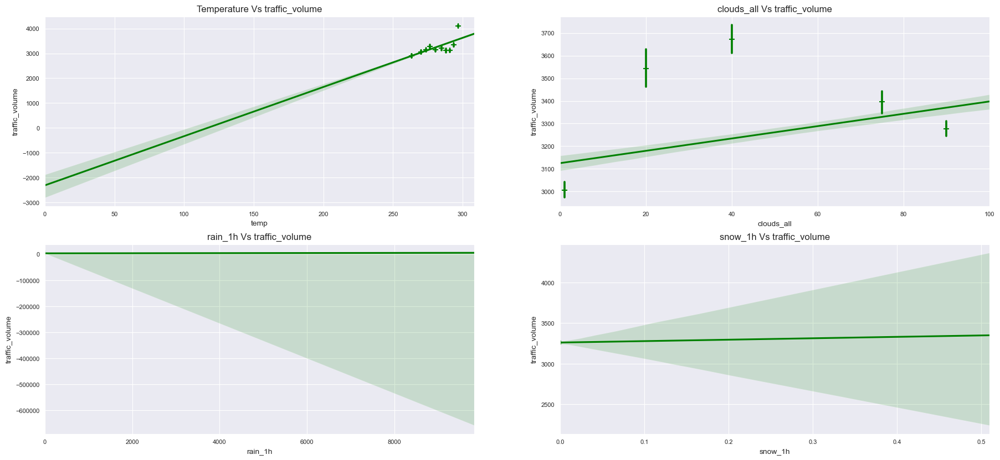

In [14]:
sns.set_style("darkgrid")
fig,ax = plt.subplots(2,2,figsize = (22,10))
sns.regplot(x = 'temp',y = 'traffic_volume',data = data,marker = '+',color = 'g',x_bins = 10,ax=ax[0,0])
ax[0,0].set_title("Temperature Vs traffic_volume")
sns.regplot(x = 'clouds_all',y = 'traffic_volume',data = data,marker = '+',color = 'g',ax=ax[0,1],x_bins = 10)
ax[0,1].set_title("clouds_all Vs traffic_volume")
sns.regplot(x = 'rain_1h',y = 'traffic_volume',data = data,marker = '+',color = 'g',ax=ax[1,0],x_bins = 20)
ax[1,0].set_title("rain_1h Vs traffic_volume")
sns.regplot(x = 'snow_1h',y = 'traffic_volume',data = data,marker = '+',color = 'g',ax=ax[1,1],x_bins = 20)
ax[1,1].set_title("snow_1h Vs traffic_volume")

As we observe some strange behaviour of rain_1h and snow_1h, we can scatter plot them with respect to traffic volume to understand them more closely

In [15]:
data['snow_1h'].nunique()

12

<AxesSubplot:xlabel='snow_1h', ylabel='traffic_volume'>

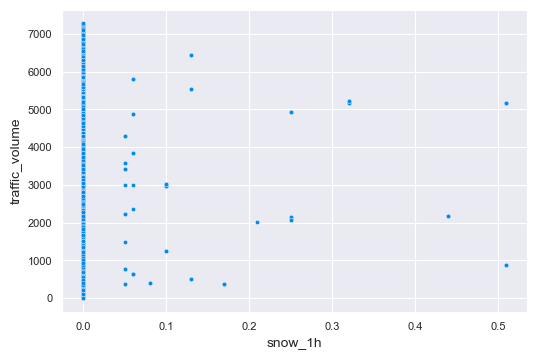

In [16]:
sns.scatterplot(data=data, x="snow_1h", y="traffic_volume")

<AxesSubplot:xlabel='rain_1h', ylabel='traffic_volume'>

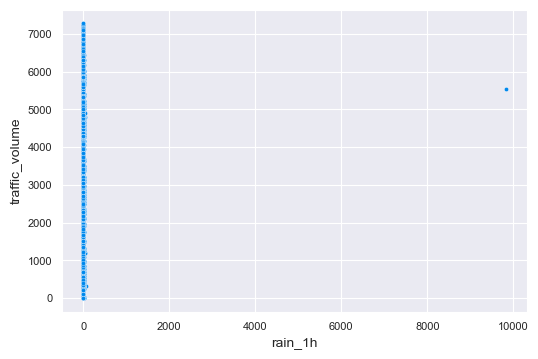

In [17]:
sns.scatterplot(data=data, x="rain_1h", y="traffic_volume")

In [18]:
data.holiday.value_counts()

None                         38515
Labor Day                        5
Columbus Day                     5
Christmas Day                    5
Thanksgiving Day                 5
New Years Day                    5
Independence Day                 4
Veterans Day                     4
Memorial Day                     4
State Fair                       4
Washingtons Birthday             4
Martin Luther King Jr Day        3
Name: holiday, dtype: int64

In [71]:
data[data['holiday']!='None']

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
126,2012-10-08,Columbus Day,273.080,0.00,0.0,20,Clouds,few clouds,455
1123,2012-11-12,Veterans Day,288.120,0.00,0.0,87,Clear,sky is clear,1000
1370,2012-11-22,Thanksgiving Day,278.540,0.00,0.0,20,Mist,mist,919
2360,2012-12-25,Christmas Day,264.400,0.00,0.0,90,Clouds,overcast clouds,803
2559,2013-01-01,New Years Day,263.490,0.00,0.0,58,Clouds,broken clouds,1439
3697,2013-02-18,Washingtons Birthday,258.960,0.00,0.0,20,Clouds,few clouds,556
6430,2013-05-27,Memorial Day,286.370,0.00,0.0,90,Clouds,overcast clouds,863
7414,2013-07-04,Independence Day,290.080,0.00,0.0,1,Clear,sky is clear,1060
8575,2013-08-22,State Fair,297.420,0.00,0.0,12,Clouds,few clouds,661
8742,2013-09-02,Labor Day,288.780,0.00,0.0,0,Clear,Sky is Clear,1041


In [72]:
isholiday=data.holiday!='None'
date=data.date_time[isholiday].dt.date.values
holiday=data.holiday[isholiday].values
mapping=dict(zip(date,holiday))
data['holiday']=data['date_time'].dt.date.map(mapping)
data.loc[data['holiday'].isna(),'holiday'] = 'Work Day'
data['holiday'].value_counts()

Work Day                     37462
Labor Day                      114
Columbus Day                   112
Thanksgiving Day               111
New Years Day                  107
Memorial Day                   106
Christmas Day                  104
State Fair                      97
Independence Day                96
Veterans Day                    96
Washingtons Birthday            95
Martin Luther King Jr Day       63
Name: holiday, dtype: int64

In [73]:
data['holiday'].map(lambda x: 'Holiday' if x != 'Work Day' else 'Work Day').value_counts(normalize=True)

Work Day    0.971449
Holiday     0.028551
Name: holiday, dtype: float64

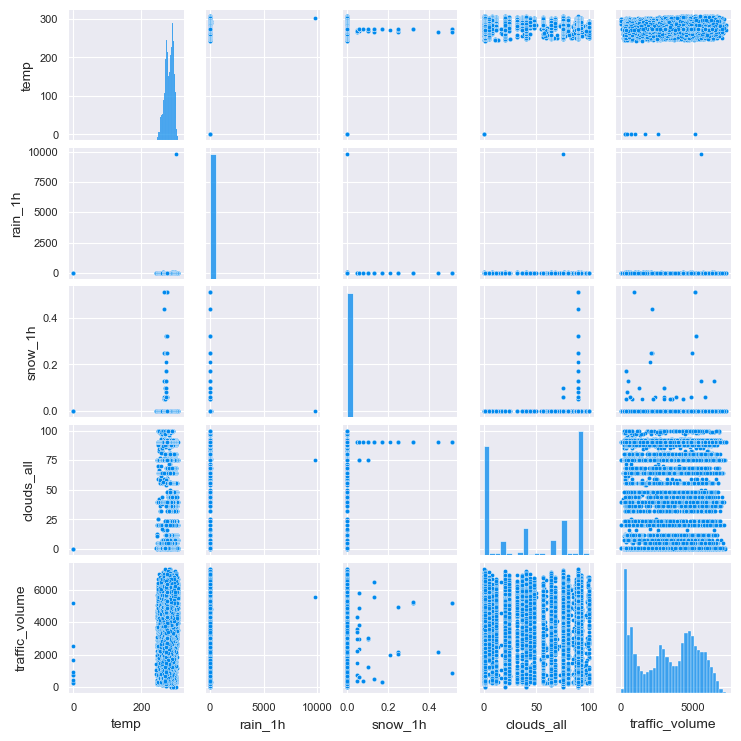

In [22]:
column = ['temp','rain_1h','snow_1h','clouds_all','traffic_volume']
sns.pairplot(data[column],height = 1.5)

In [74]:
data.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918


In [24]:
data['clouds_all'].nunique()

60

In [75]:
data['year'] = pd.DatetimeIndex(data['date_time']).year
data.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,year
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,2012
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,2012
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,2012
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,2012
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,2012


In [76]:
data['day'] = data.date_time.dt.day
data['month'] = data.date_time.dt.month_name()
data['weekday'] = data.date_time.dt.day_name()
data['hour'] = data.date_time.dt.hour

In [83]:
data.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,year,day,month,weekday,hour
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,2012,2,October,Tuesday,9
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,2012,2,October,Tuesday,10
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,2012,2,October,Tuesday,11
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,2012,2,October,Tuesday,12
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,2012,2,October,Tuesday,13


In [78]:
data['month'].unique()

array(['October', 'November', 'December', 'January', 'February', 'March',
       'April', 'May', 'June', 'July', 'August', 'September'],
      dtype=object)

In [84]:
data['weather_main'].unique()

array(['Clouds', 'Clear', 'Rain', 'Drizzle', 'Mist', 'Haze', 'Fog',
       'Thunderstorm', 'Snow', 'Squall', 'Smoke'], dtype=object)

In [85]:
data.shape

(38563, 14)

In [86]:
data.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,year,day,month,weekday,hour
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,2012,2,October,Tuesday,9
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,2012,2,October,Tuesday,10
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,2012,2,October,Tuesday,11
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,2012,2,October,Tuesday,12
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,2012,2,October,Tuesday,13


Text(0.5, 1.0, 'traffic volumes in different weekdays at different hour')

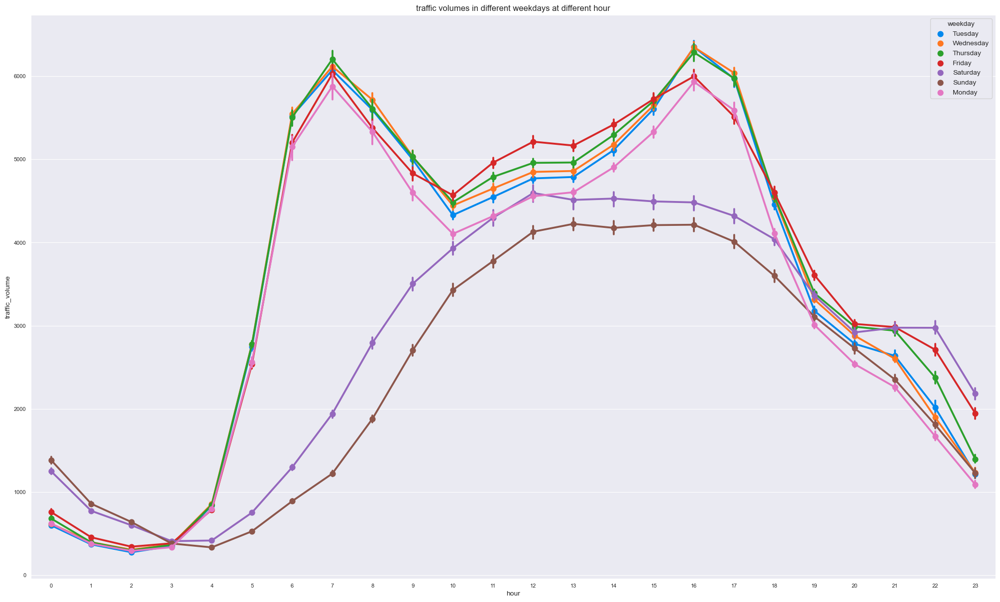

In [90]:
plt.figure(figsize = (25,15))
sns.pointplot(x=  'hour', y = 'traffic_volume', hue = 'weekday' , data = data)
plt.title("traffic volumes in different weekdays at different hour") 

From Above plot we can observe that
traffic volume During:
  monday,friday=Moderate        :         Tuesday,wednesday,thursday=High       :          Saturday,Sunday=Low

And the traffic volume is high during THE HOUR 5-8  AND 15-18

Text(0.5, 1.0, 'traffic volumes in different months at different weekdays')

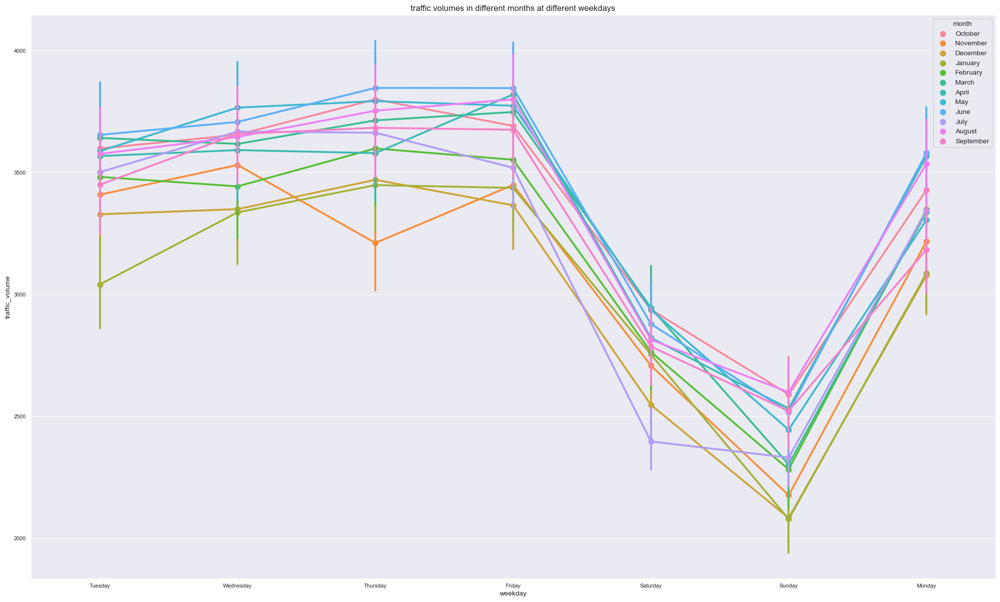

In [91]:
plt.figure(figsize = (25,15))
sns.pointplot(x=  'weekday', y = 'traffic_volume', hue = 'month' , data = data)
plt.title("traffic volumes in different months at different weekdays") 

FROM ABOVE PLOT WE CAN OBSERVE THAT IN EVERY MONTH DURING SATURDAY,SUNDAY THE TRAFFIC VOLUME IS VERY LOW.AND IN MONTHS JUNE,MAY,MARCH,SEPTEMBER,APRIL THE TRAFFIC VOLUME IS HIGH

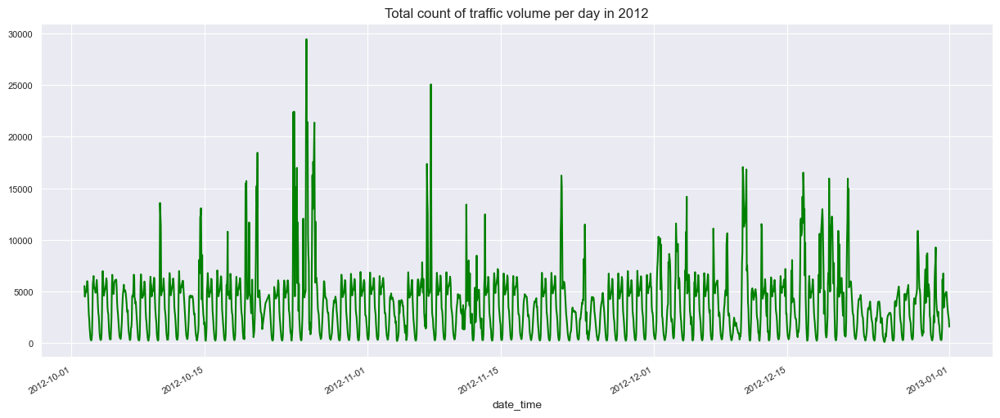

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

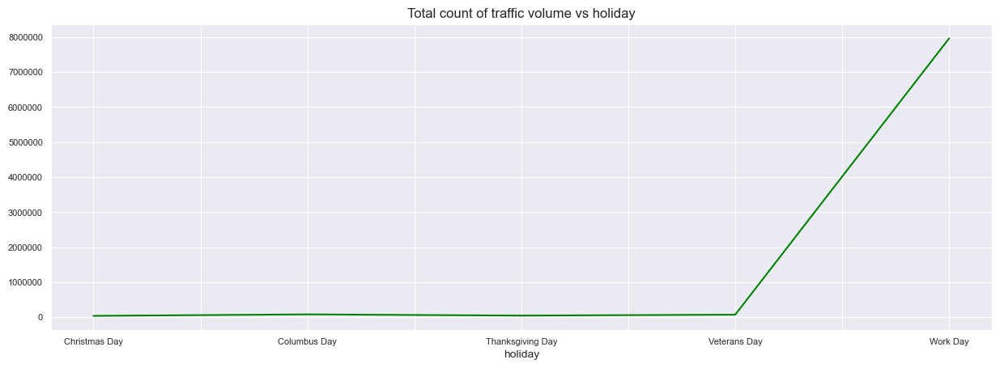

In [94]:
y_2012 = data.loc[data['year']==2012] 
y_2012.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2012")
plt.show()
y_2012.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

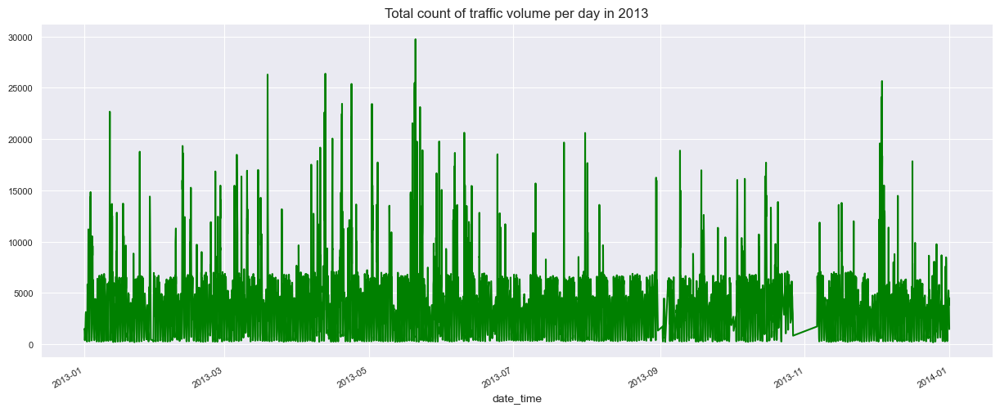

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

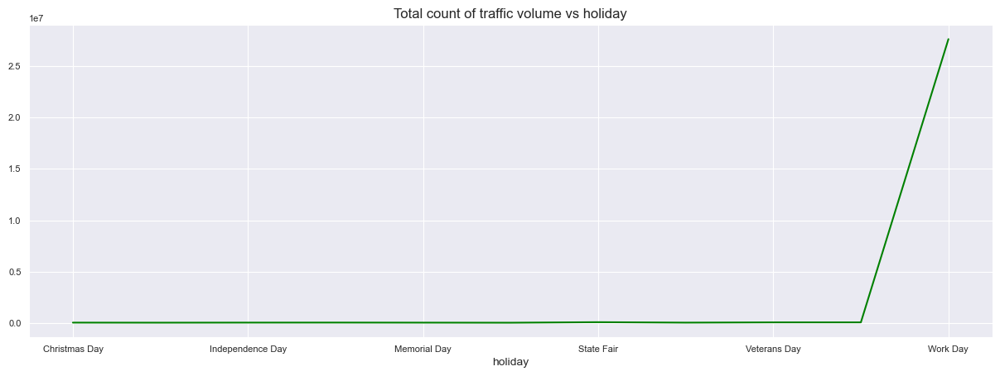

In [96]:
y_2013 = data.loc[data['year']==2013] 
y_2013.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2013")
plt.show()
y_2013.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

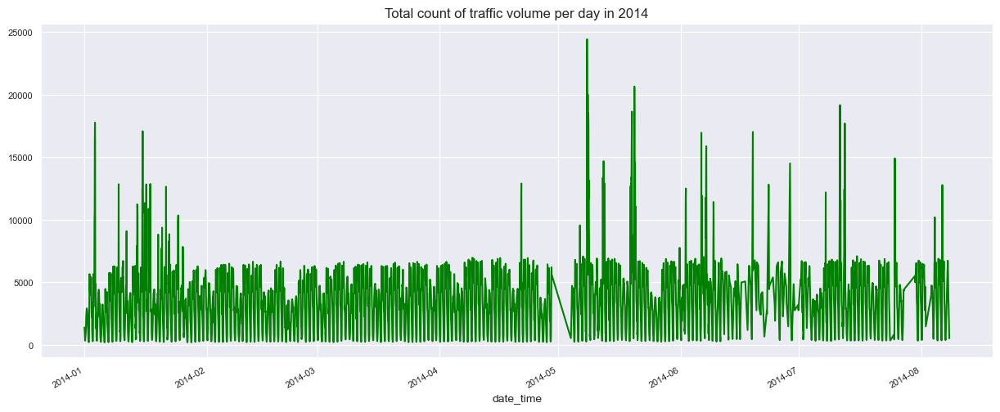

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

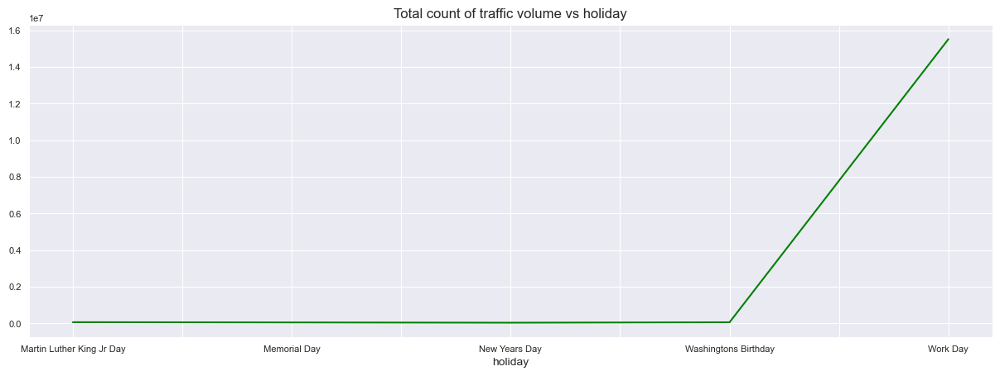

In [97]:
y_2014 = data.loc[data['year']==2014] 
y_2014.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2014")
plt.show()
y_2014.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

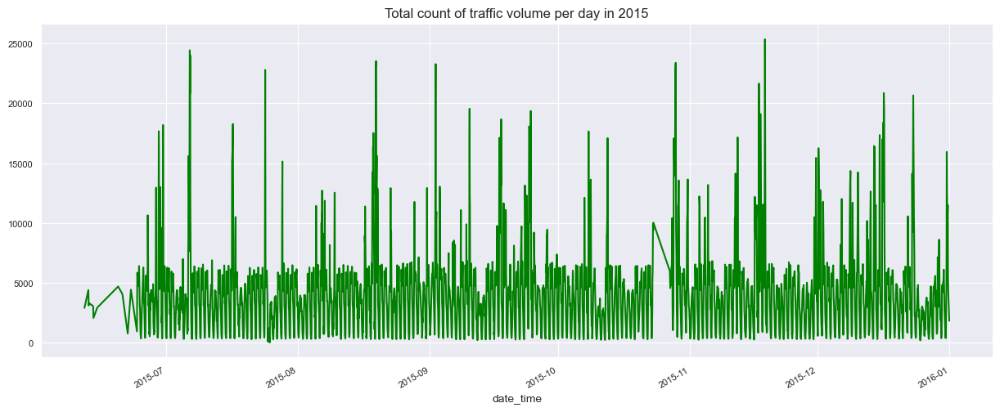

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

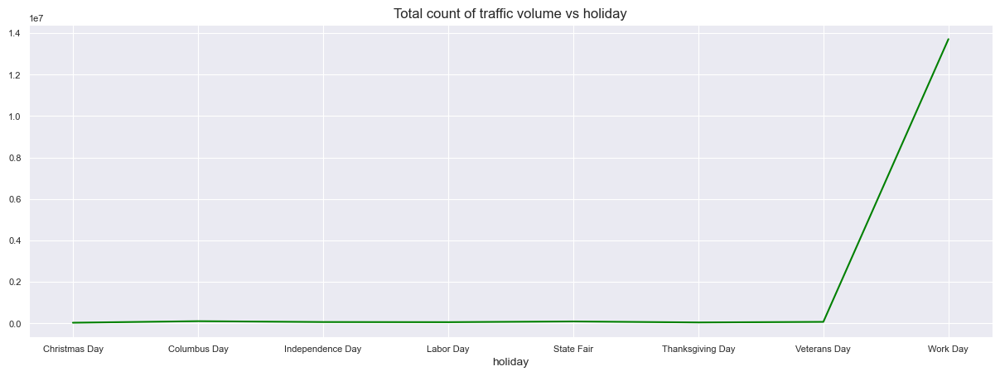

In [98]:
y_2015 = data.loc[data['year']==2015] 
y_2015.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2015")
plt.show()
y_2015.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

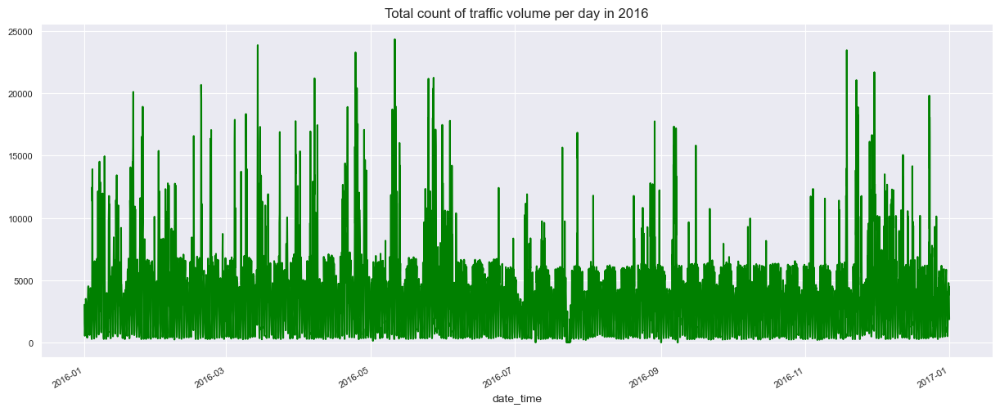

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

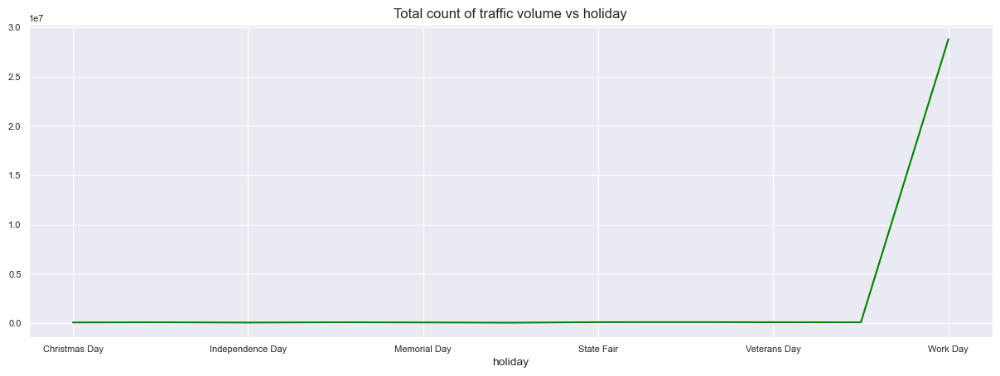

In [99]:
y_2016 = data.loc[data['year']==2016] 
y_2016.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2016")
plt.show()
y_2016.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

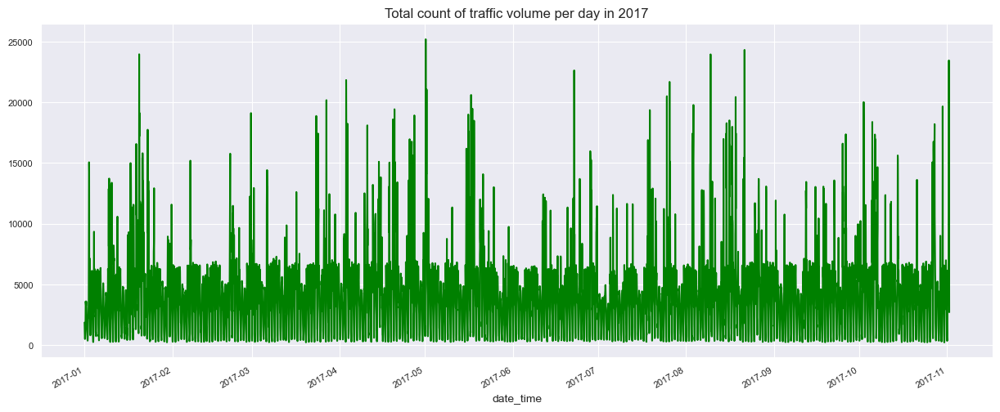

Text(0.5, 1.0, 'Total count of traffic volume vs holiday')

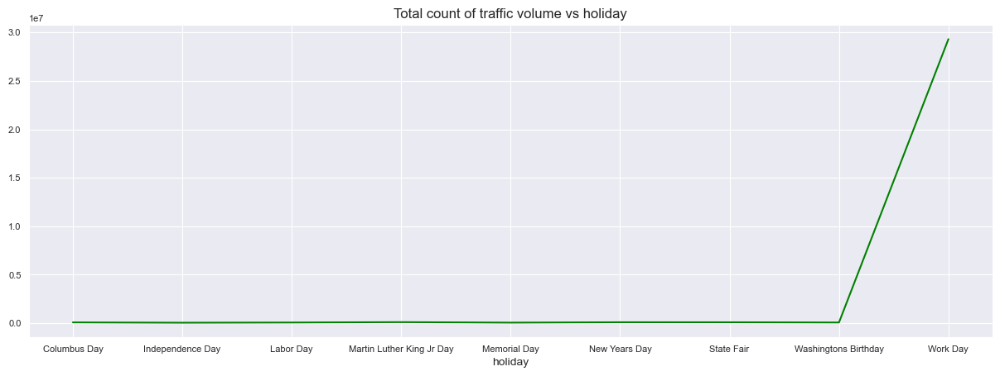

In [100]:
y_2017 = data.loc[data['year']==2017] 
y_2017.groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,6),color = 'g')
plt.title("Total count of traffic volume per day in 2017")
plt.show()
y_2017.groupby('holiday')['traffic_volume'].sum().plot(kind = 'line',figsize = (15,5),color ='g')
plt.title("Total count of traffic volume vs holiday")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2012')

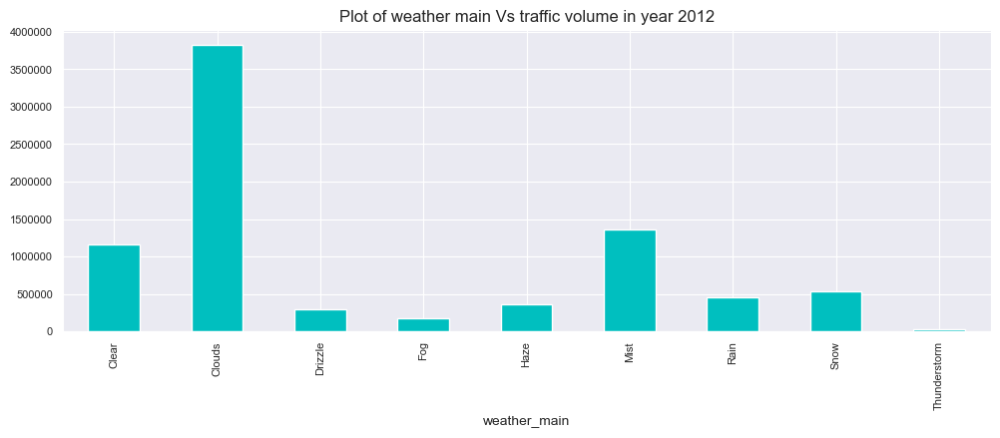

In [101]:
y_2012.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2012")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2013')

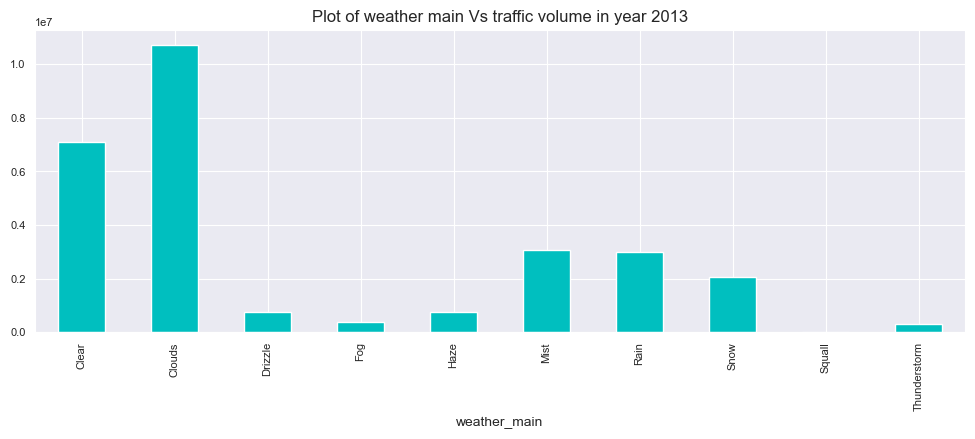

In [102]:
y_2013.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2013")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2014')

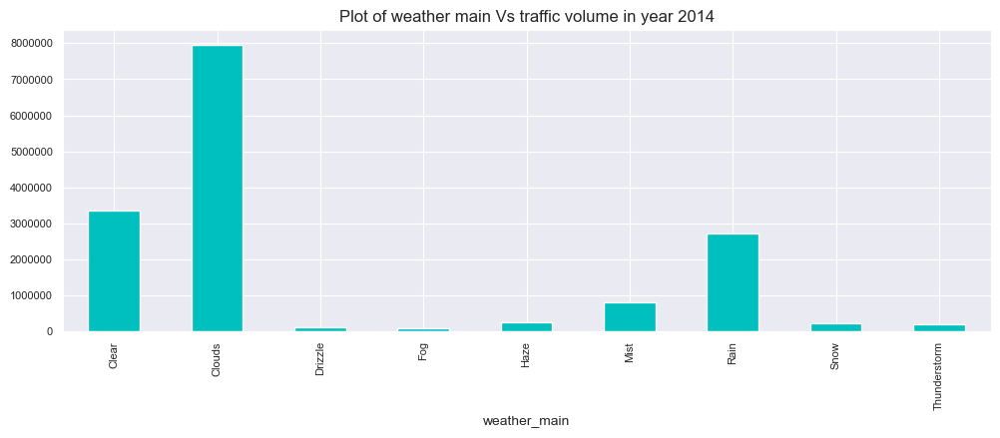

In [103]:
y_2014.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2014")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2015')

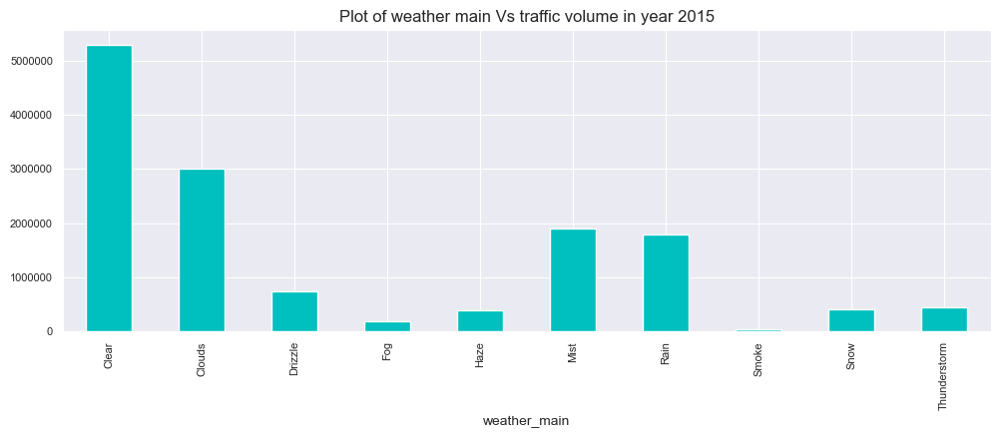

In [104]:
y_2015.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2015")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2016')

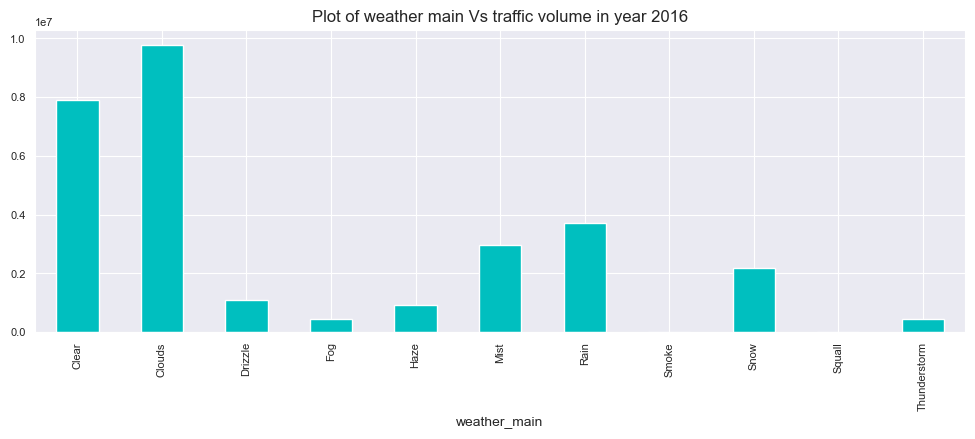

In [105]:
y_2016.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2016")

Text(0.5, 1.0, 'Plot of weather main Vs traffic volume in year 2017')

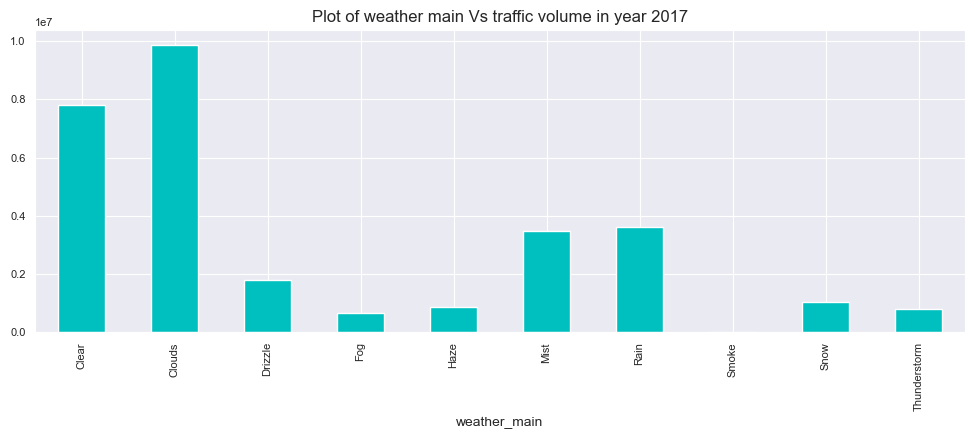

In [106]:
y_2017.groupby('weather_main')['traffic_volume'].sum().plot(kind = 'bar',color = 'c',figsize= (12,4))
plt.title("Plot of weather main Vs traffic volume in year 2017")

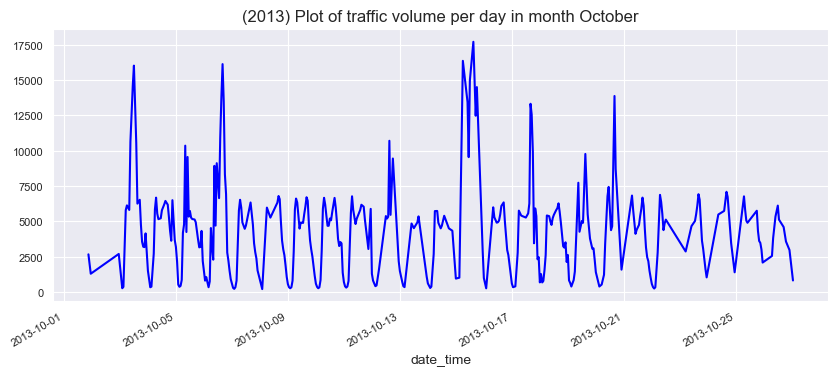

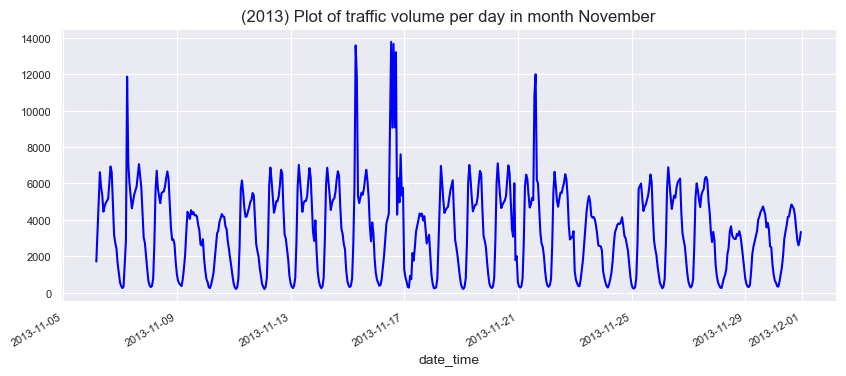

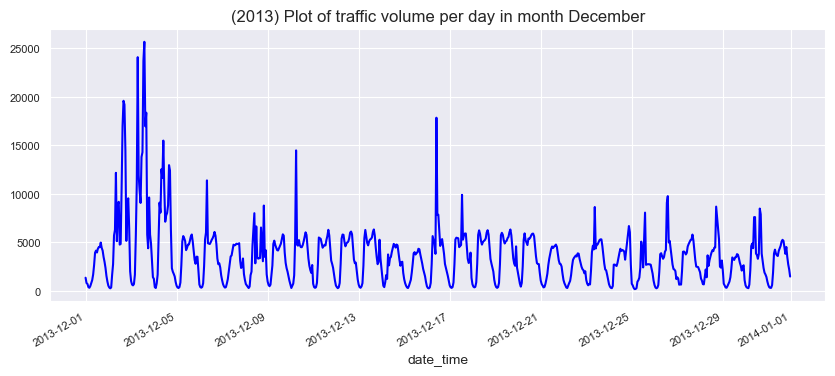

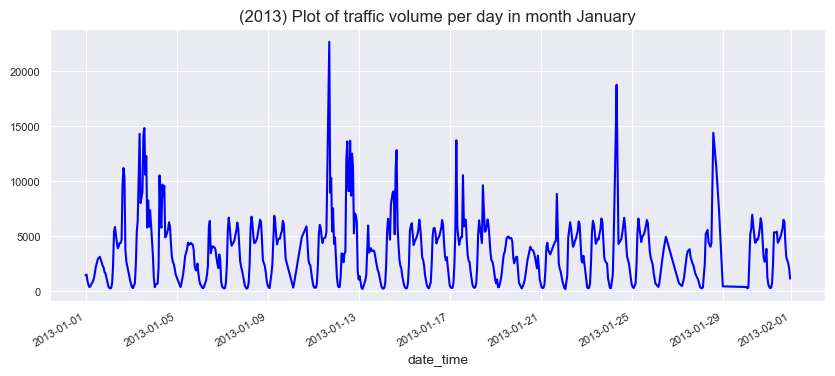

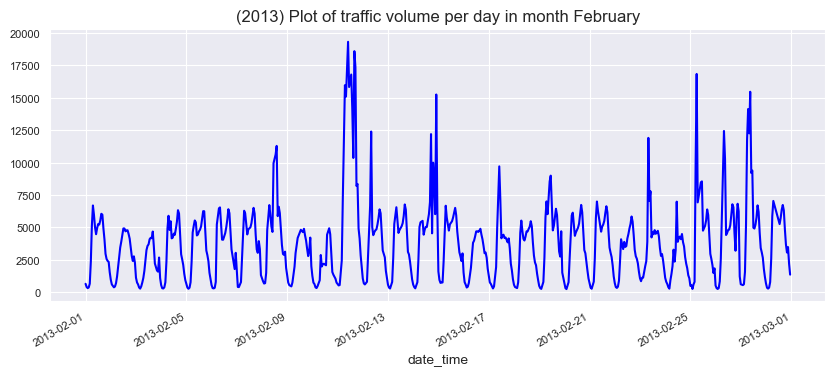

...

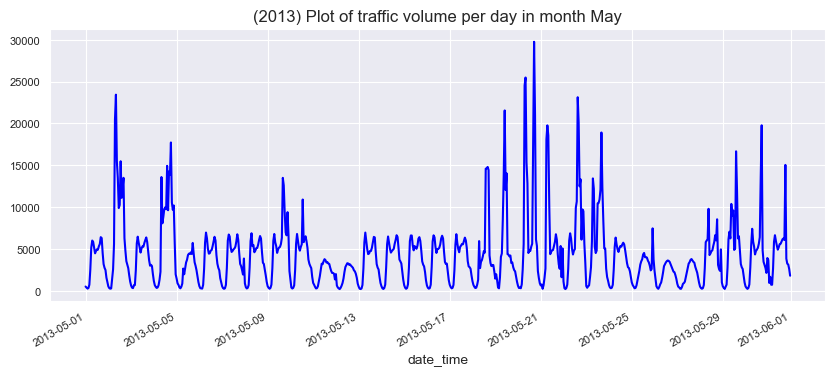

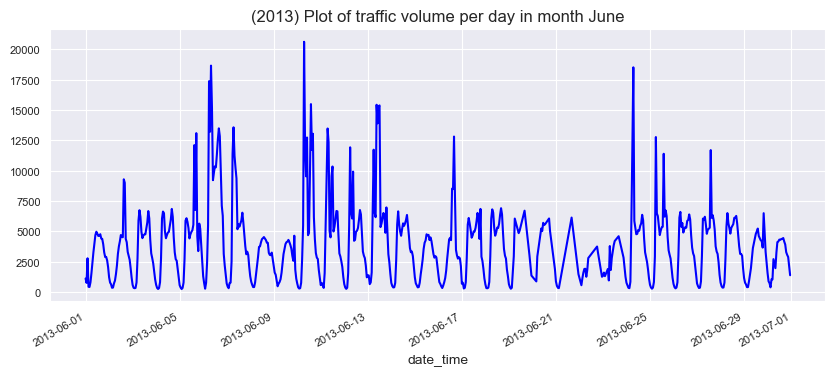

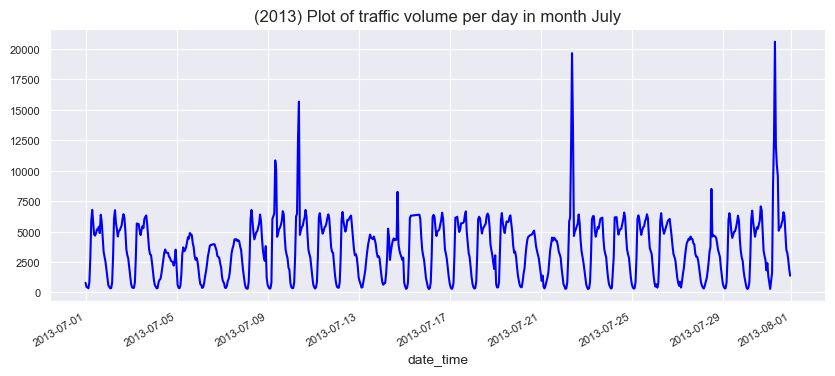

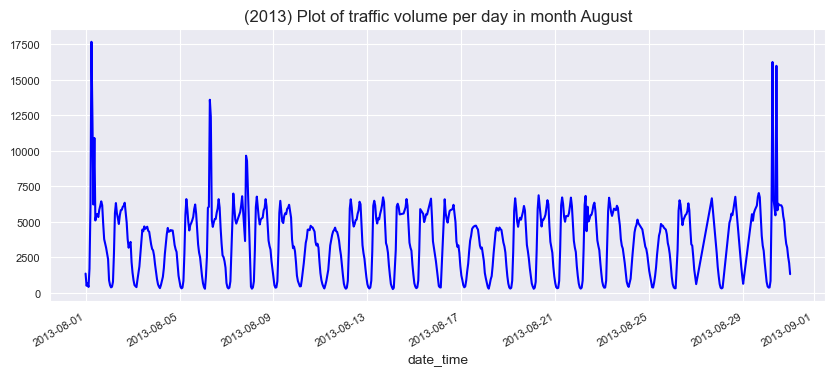

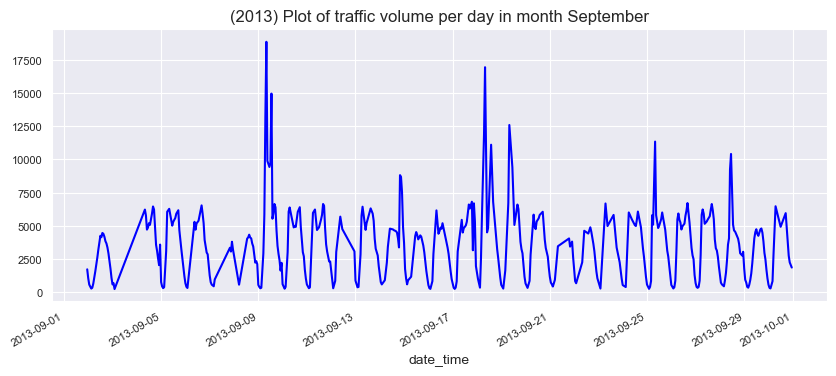

In [119]:
mnths=('October', 'November', 'December', 'January', 'February', 'March',
       'April', 'May', 'June', 'July', 'August', 'September')
for i in mnths:
     
        y_2013.loc[y_2013['month']==i].groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (10,4),color = 'b')
        plt.title("(2013) Plot of traffic volume per day in month "+str(i))
        plt.show()

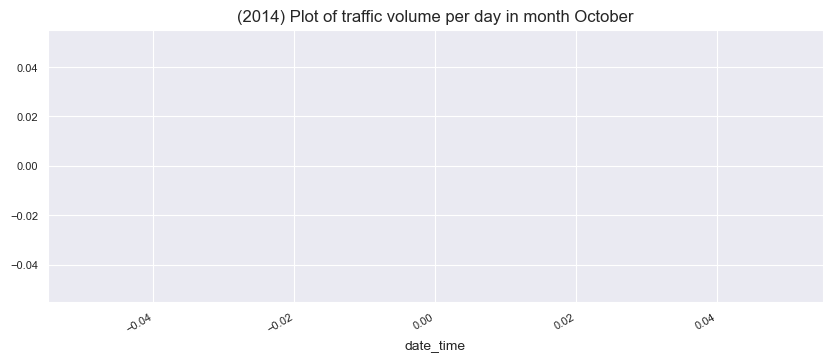

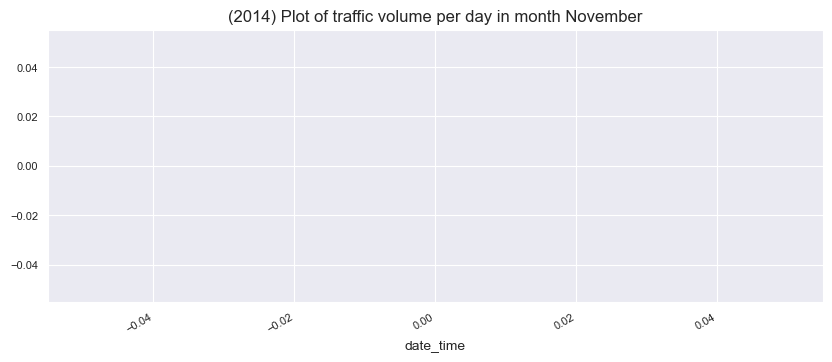

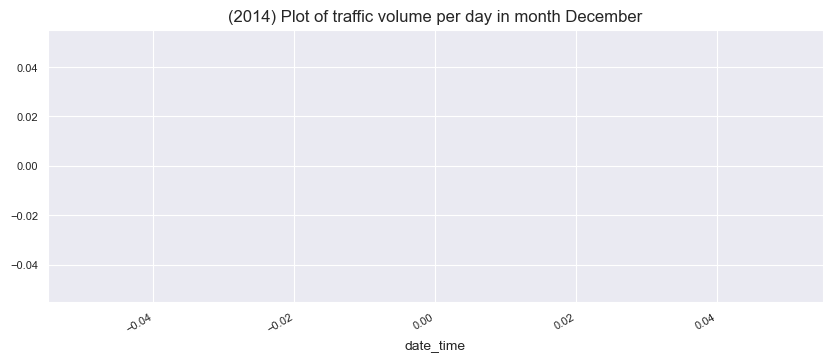

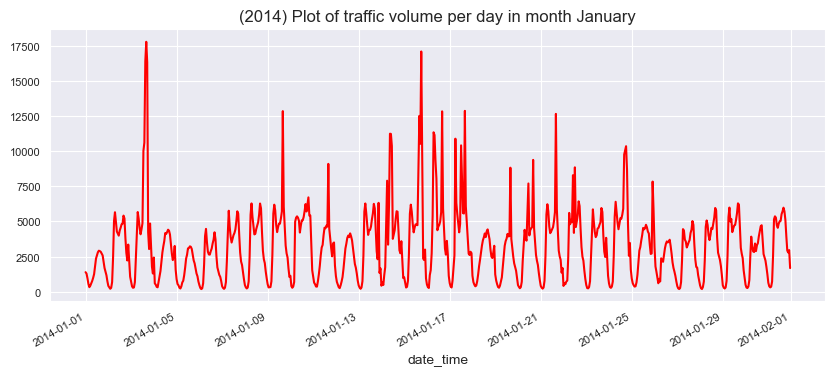

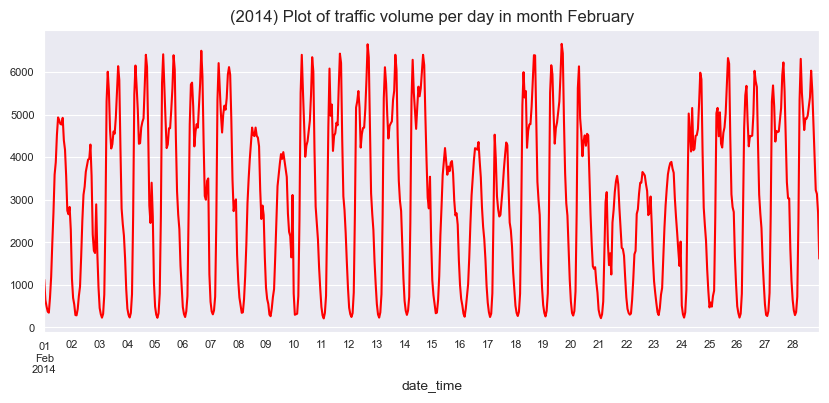

...

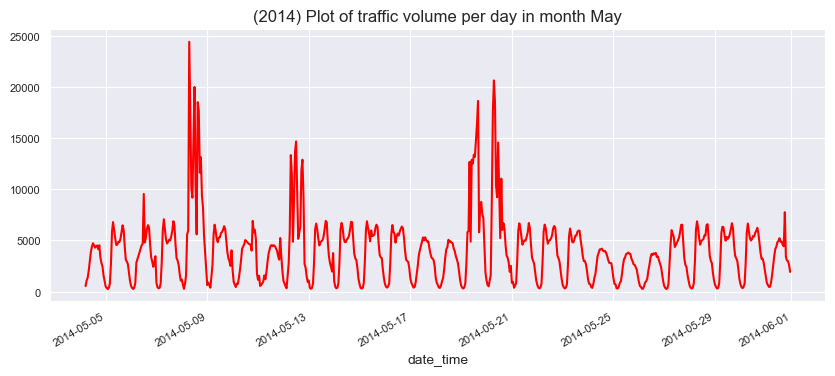

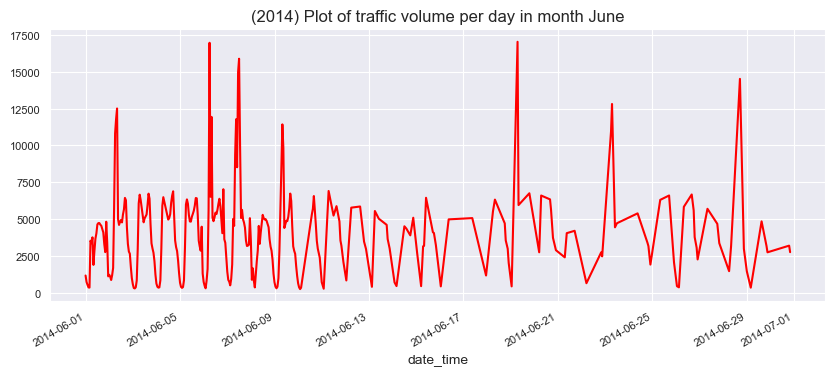

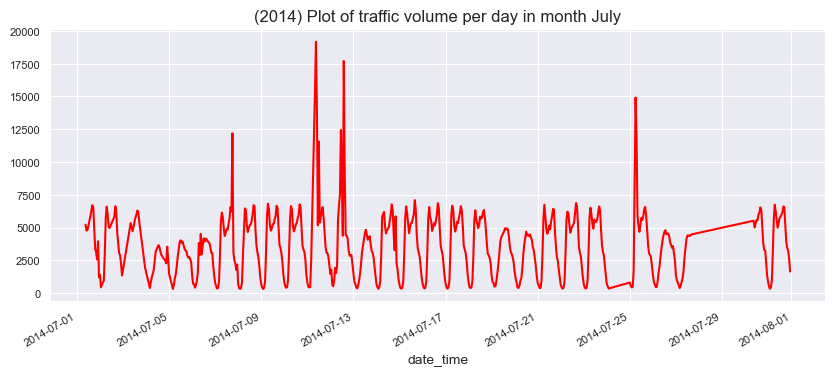

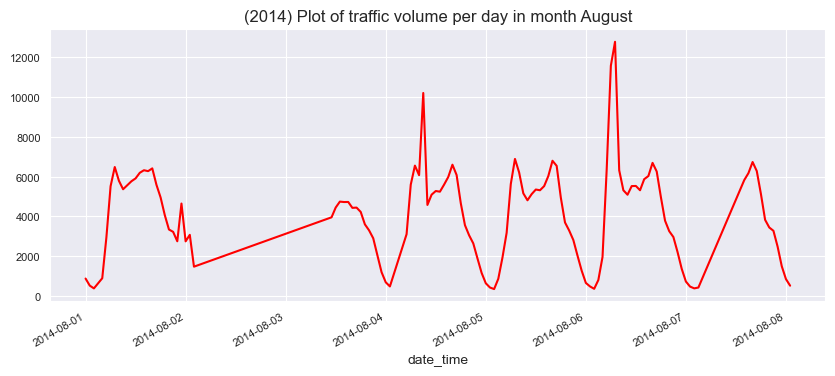

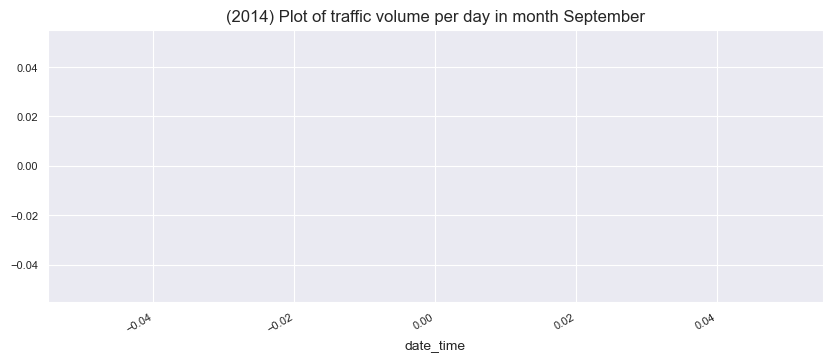

In [125]:
for i in mnths:
     
        y_2014.loc[y_2014['month']==i].groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (10,4),color = 'r')
        plt.title("(2014) Plot of traffic volume per day in month "+str(i))
        plt.show()

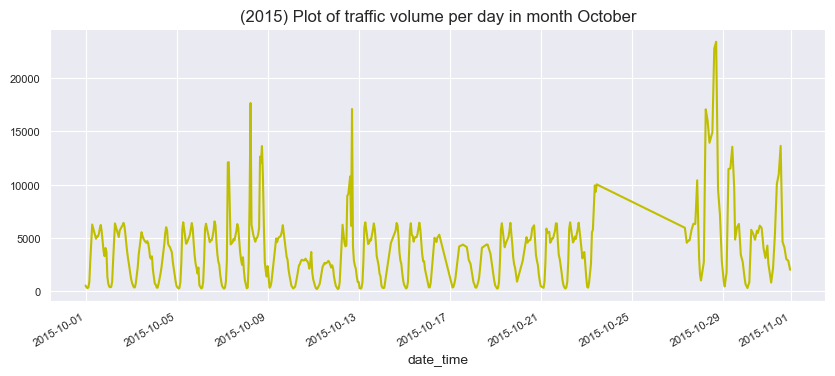

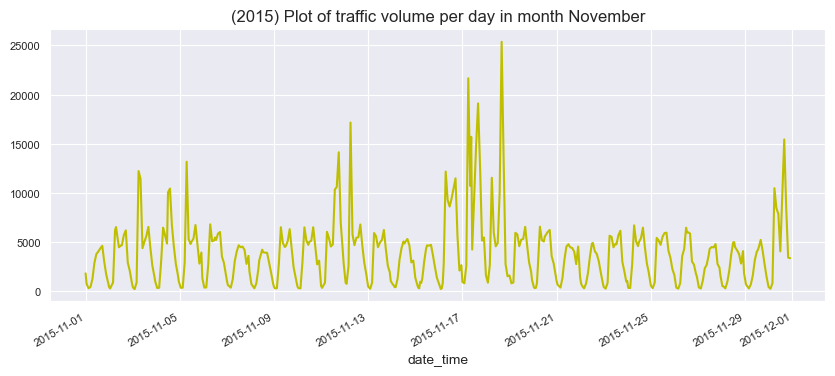

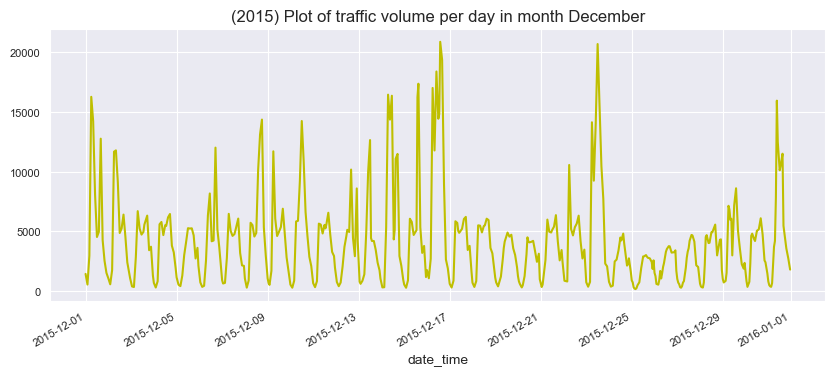

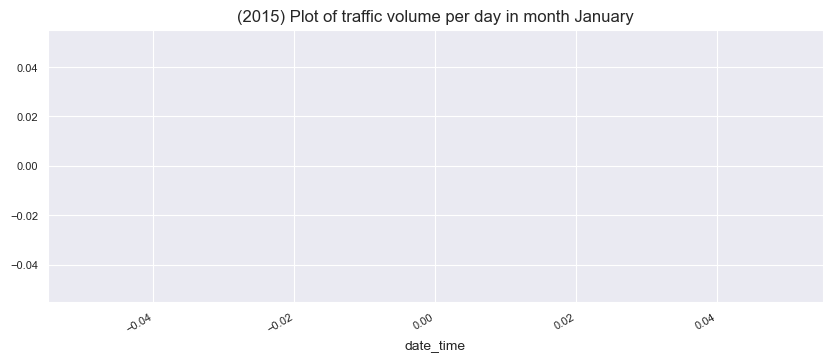

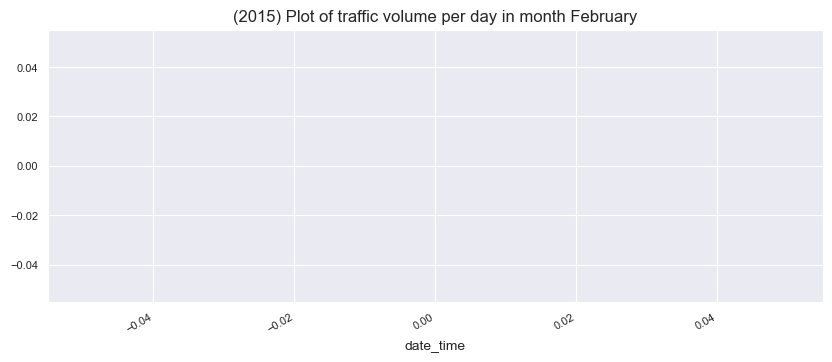

...

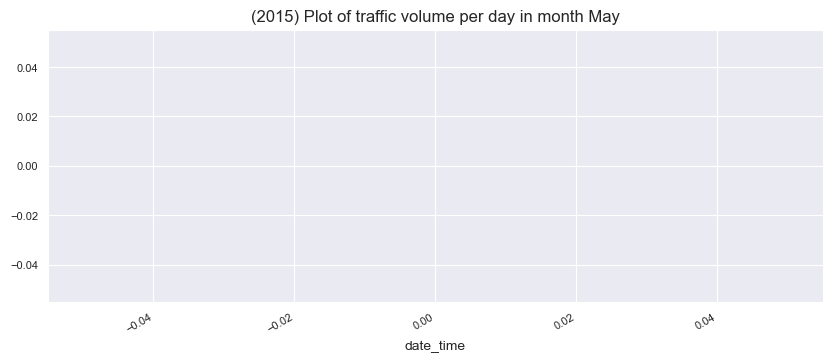

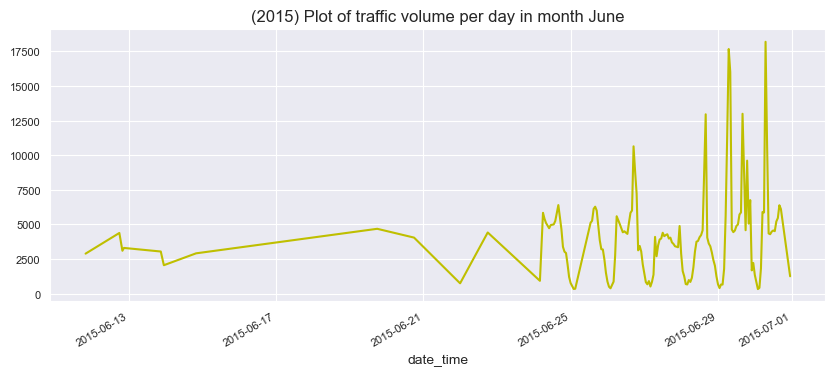

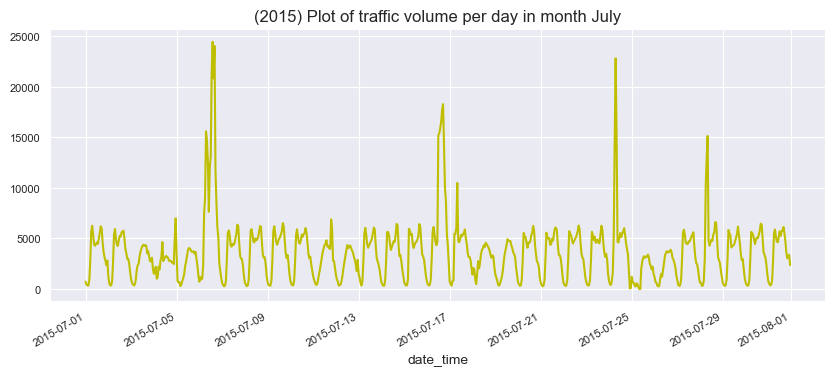

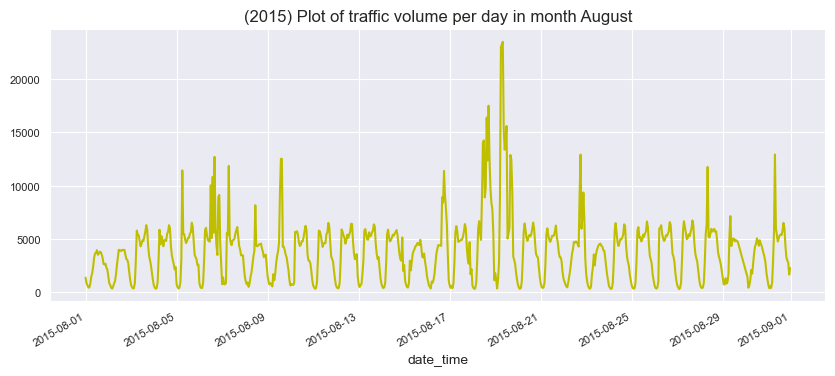

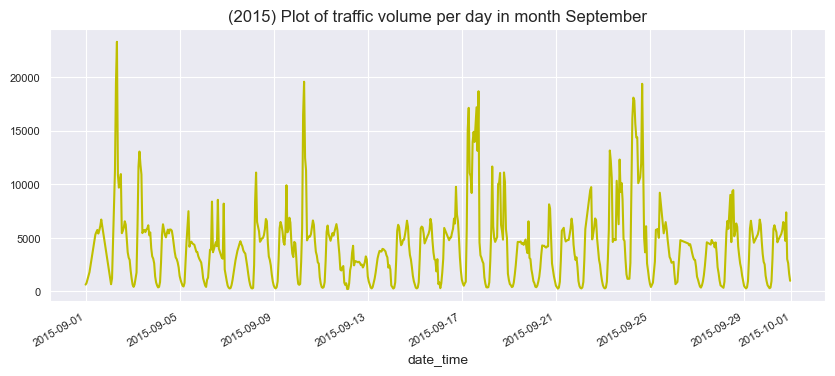

In [126]:
for i in mnths:
     
        y_2015.loc[y_2015['month']==i].groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (10,4),color = 'y')
        plt.title("(2015) Plot of traffic volume per day in month "+str(i))
        plt.show()

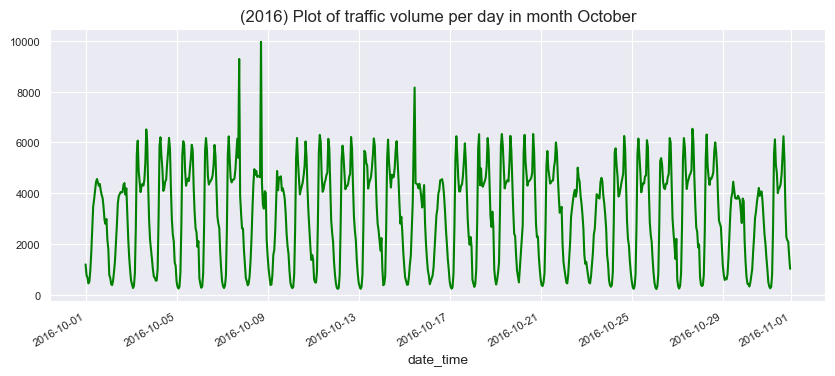

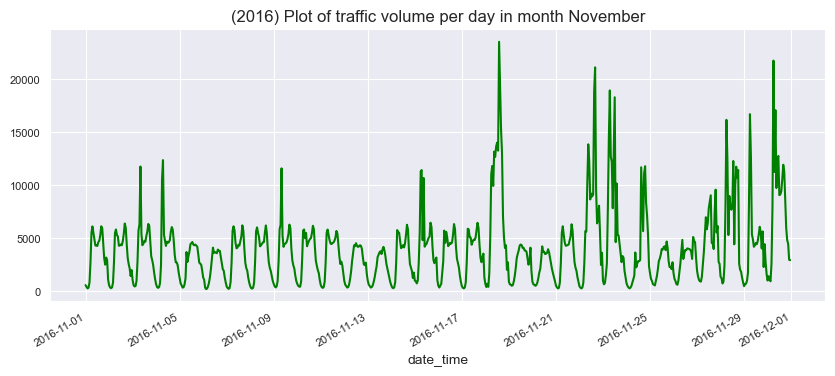

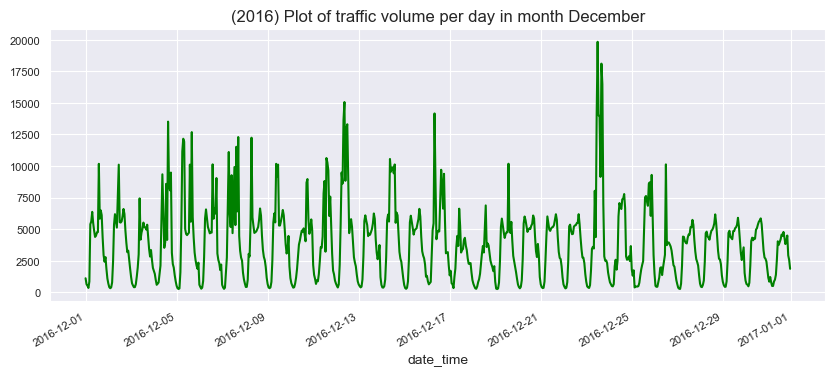

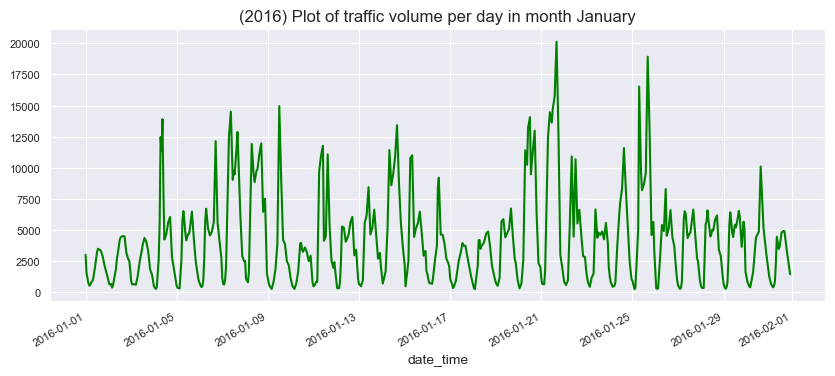

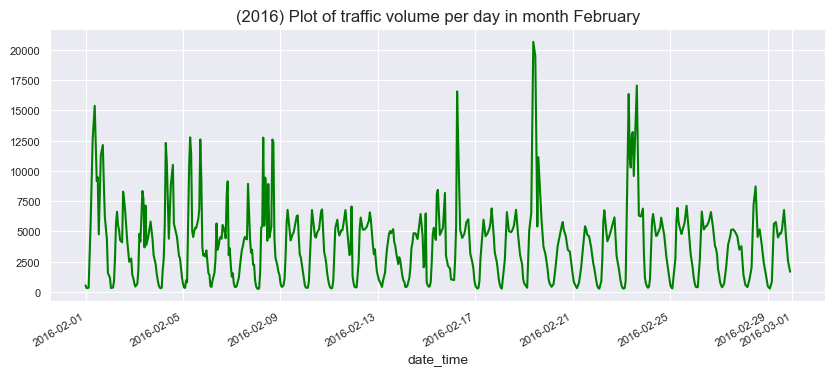

...

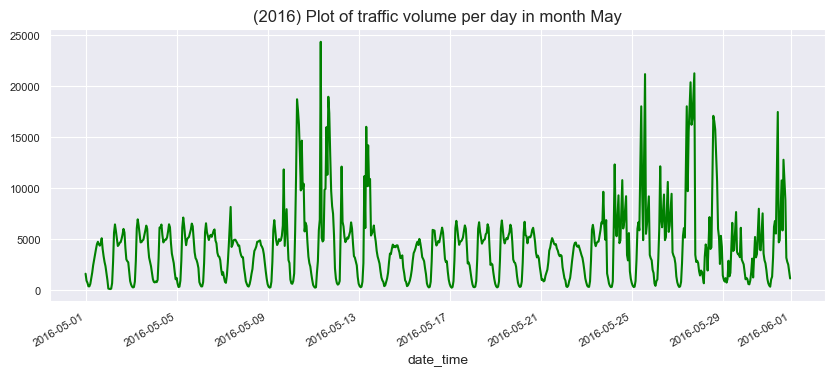

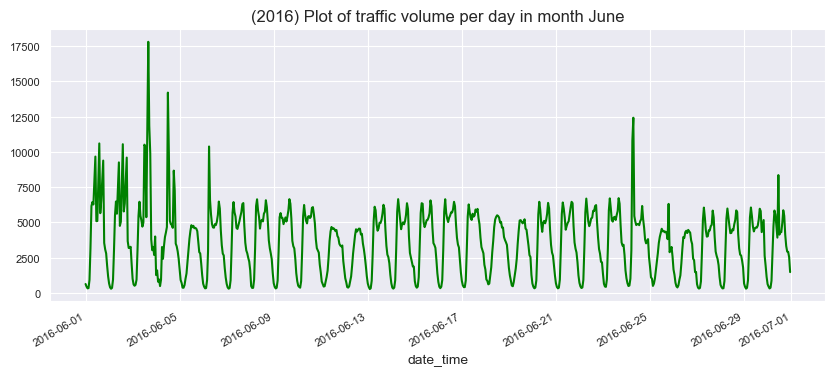

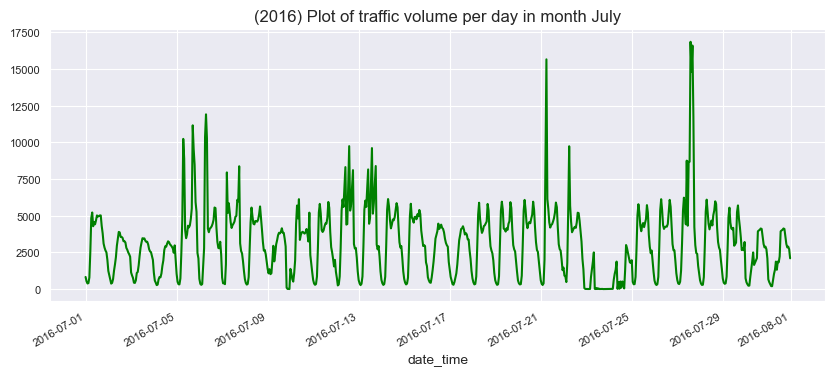

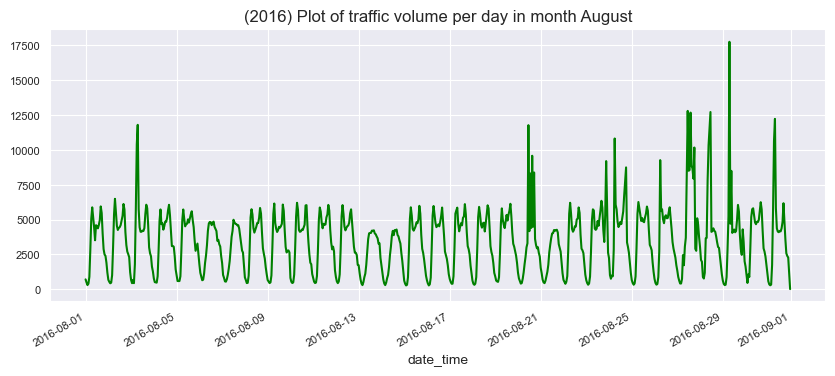

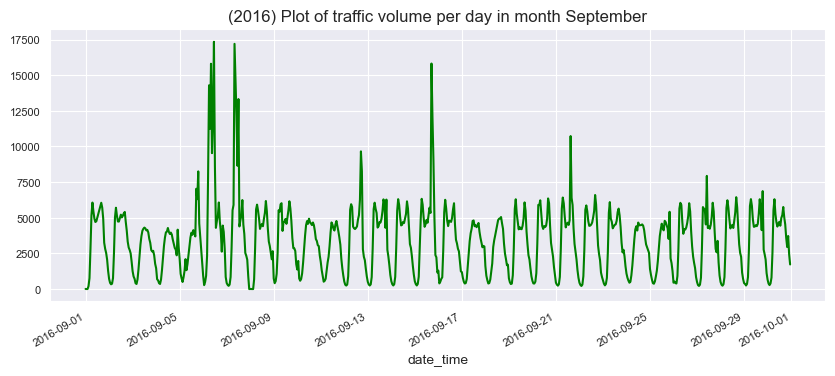

In [129]:
for i in mnths:
     
        y_2016.loc[y_2016['month']==i].groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (10,4),color = 'g')
        plt.title("(2016) Plot of traffic volume per day in month "+str(i))
        plt.show()

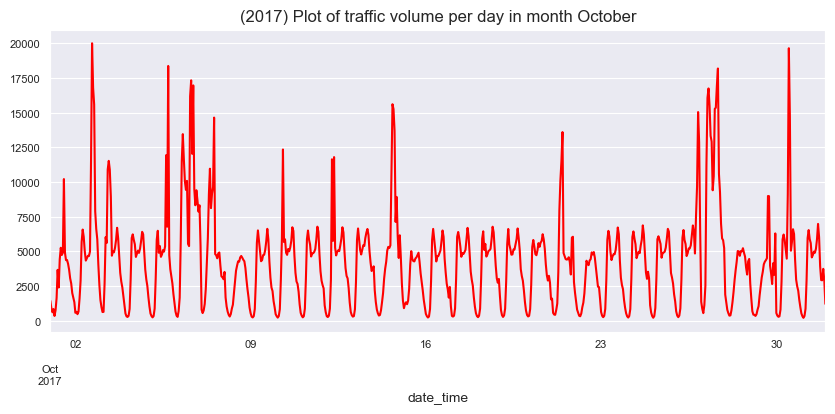

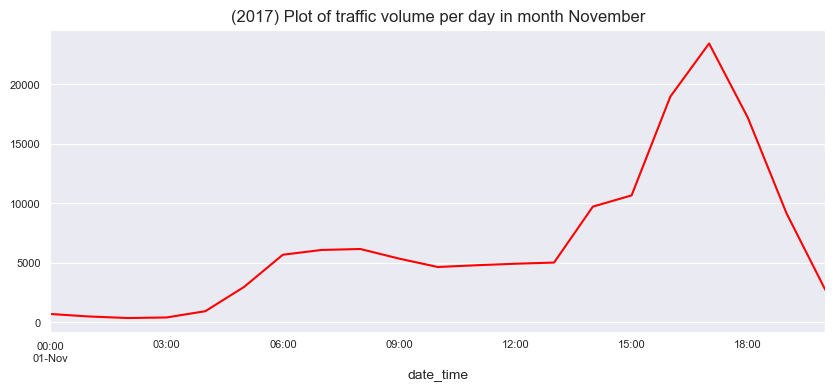

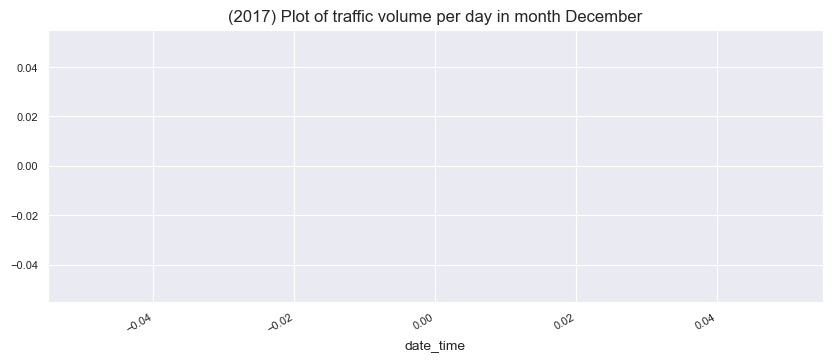

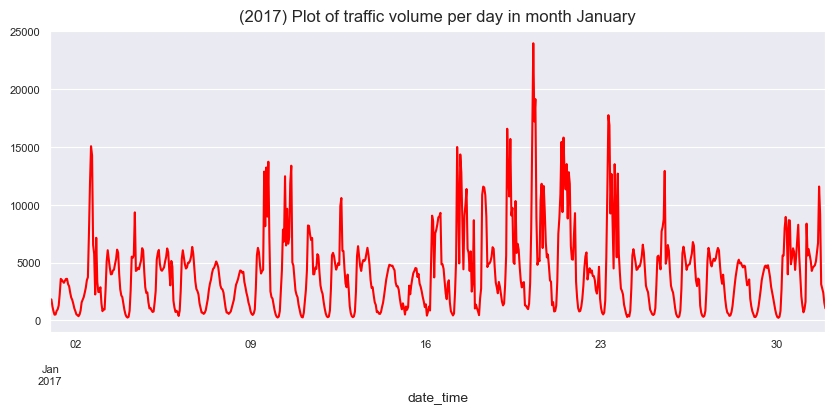

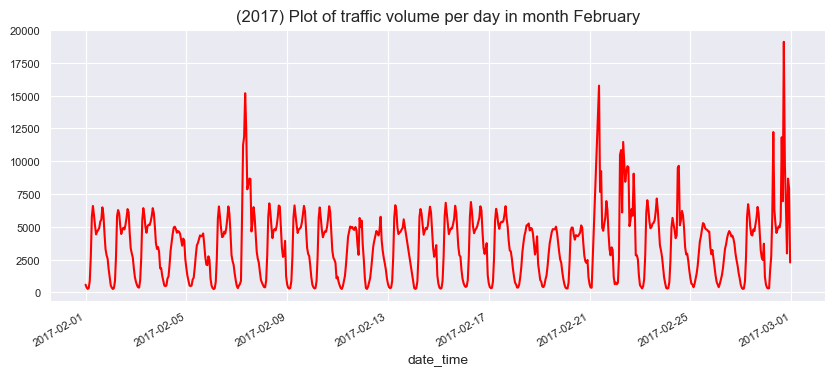

...

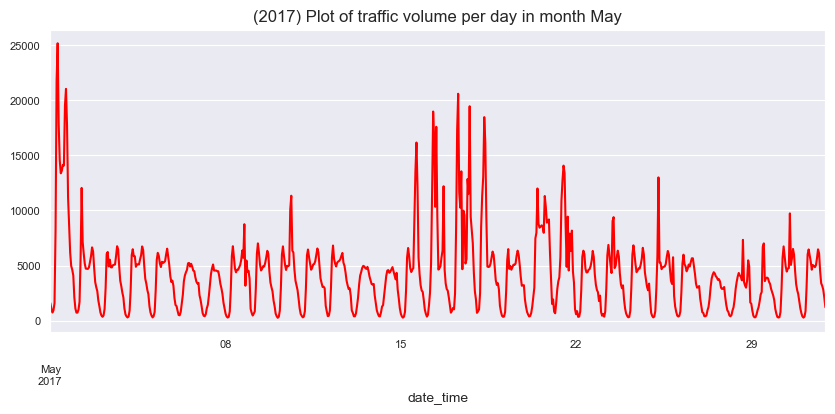

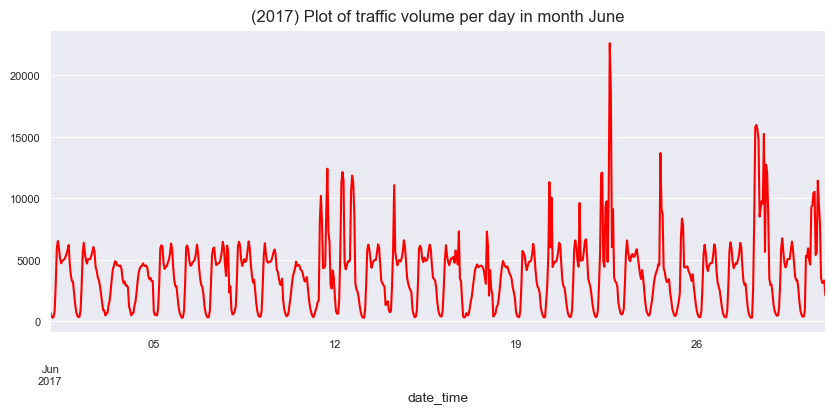

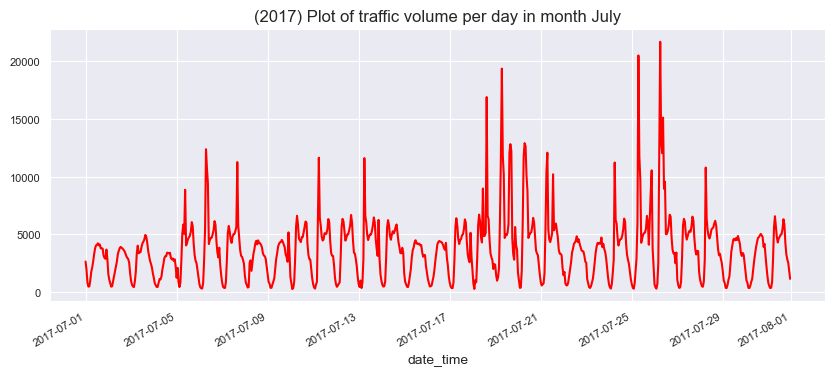

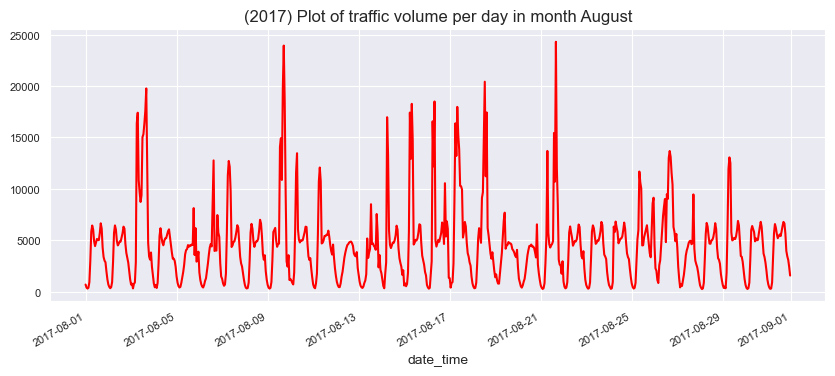

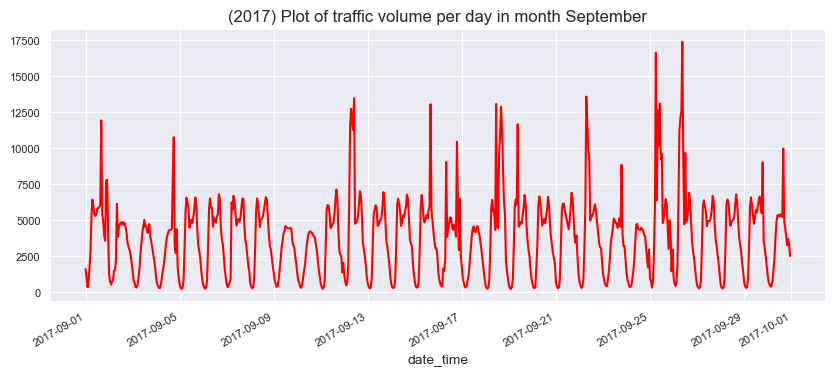

In [133]:
for i in mnths:
     
        y_2017.loc[y_2017['month']==i].groupby('date_time')['traffic_volume'].sum().plot(kind = 'line',figsize = (10,4),color = 'r')
        plt.title("(2017) Plot of traffic volume per day in month "+str(i))
        plt.show()

<AxesSubplot:xlabel='snow_1h', ylabel='traffic_volume'>

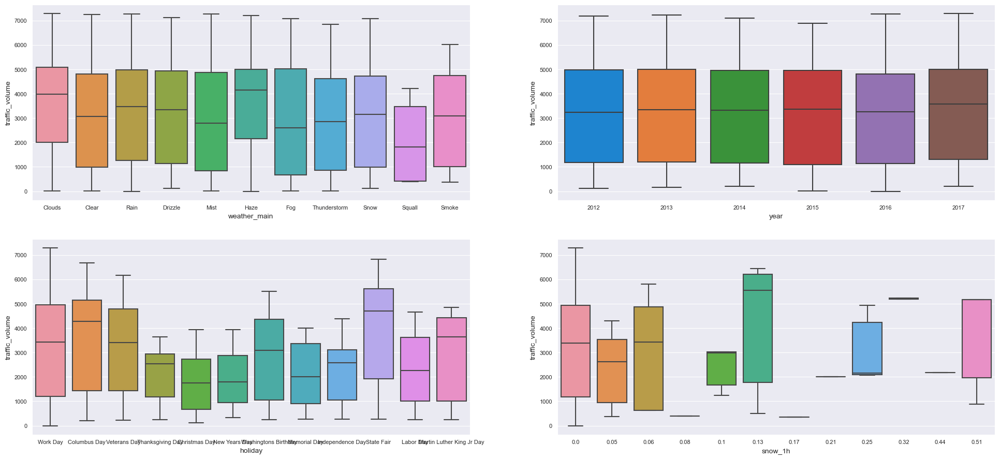

In [134]:
fig, axes = plt.subplots(2, 2, figsize=(24, 11))
sns.boxplot(ax=axes[0, 0], data=data, x='weather_main', y='traffic_volume')
sns.boxplot(ax=axes[0, 1], data=data, x='year', y='traffic_volume')
sns.boxplot(ax=axes[1,0], data=data, x='holiday', y='traffic_volume')
sns.boxplot(ax=axes[1, 1], data=data, x='snow_1h', y='traffic_volume')

<AxesSubplot:xlabel='holiday', ylabel='traffic_volume'>

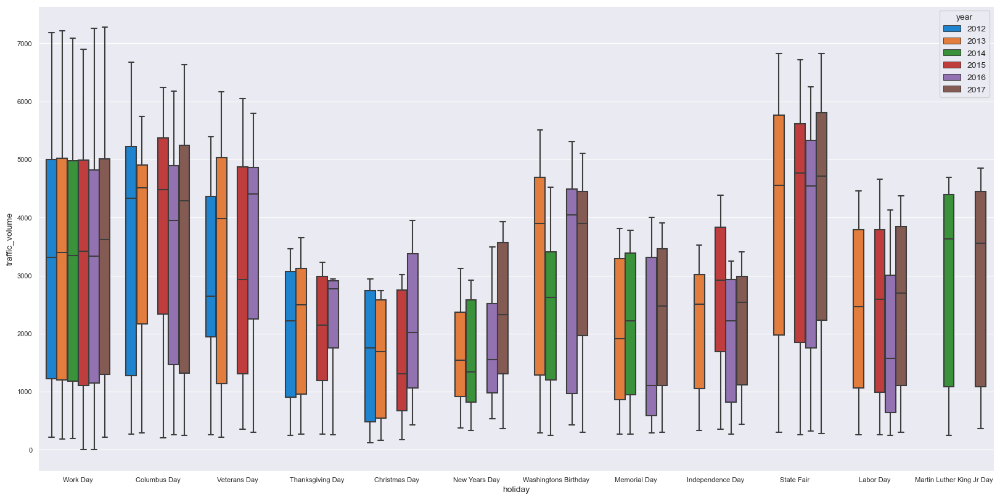

In [135]:
fig, ax = plt.subplots(figsize=(20,10))
sns.boxplot(data=data, x='holiday', y='traffic_volume',hue='year')

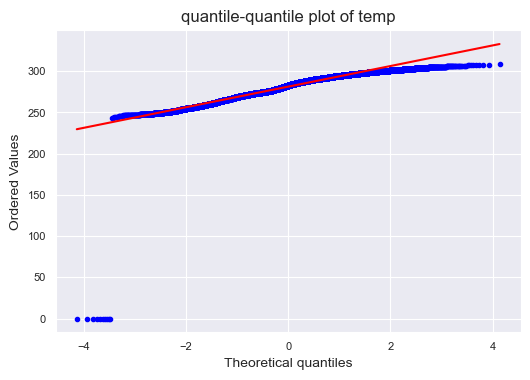

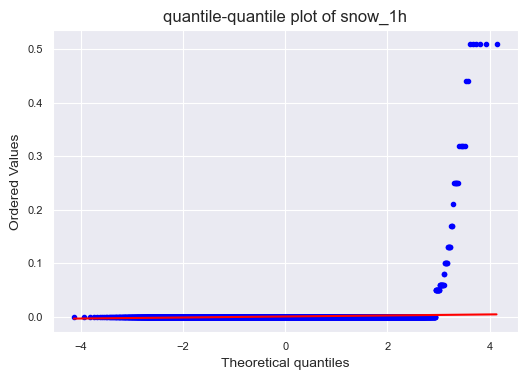

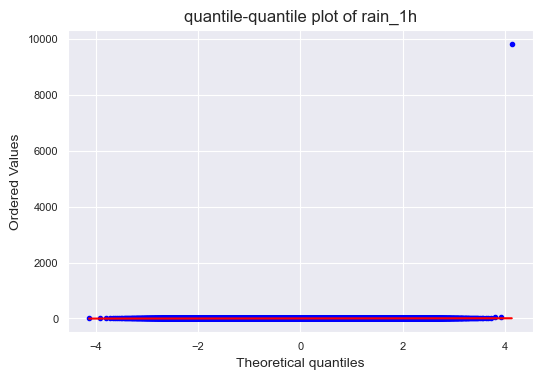

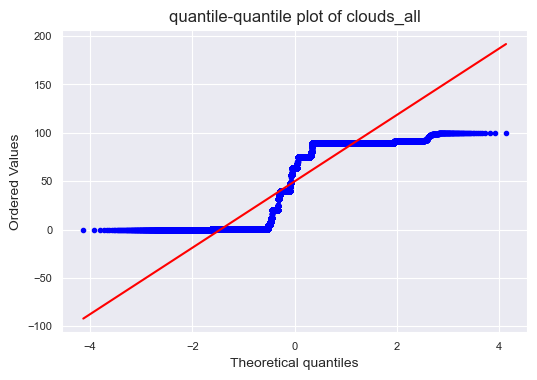

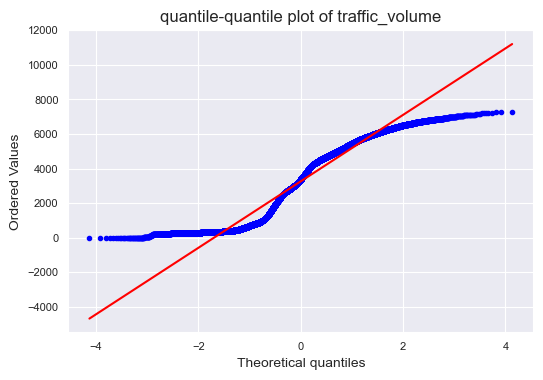

In [136]:
import scipy
cols = ['temp','snow_1h','rain_1h','clouds_all','traffic_volume']
for i in cols:
     scipy.stats.probplot(data[i], dist="norm", plot=plt)
     plt.title("quantile-quantile plot of "+i)
     plt.show()

In [137]:
import plotly.express as px
fig = px.sunburst(data, path=['year', 'weather_main'],title = "Plot of Season vs weather condition",color = 'temp')
fig.show()

In [138]:
# Replacing "0 K" to np.nan and Forward Filling values

data.loc[data.temp==0,'temp'] = np.nan

data['temp'].fillna(method='ffill',inplace=True)

In [139]:
def getDayTime(hour):
    
    if hour<4:
        return "Late Night"
    elif hour<8:
        return "Early Morning"
    elif hour<12:
        return "Morning"
    elif hour<16:
        return "Afternoon"
    elif hour<19:
        return "Evening"
    elif hour<24:
        return "Night"
    
data['day_time'] = data[['hour']].applymap(getDayTime)

data.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,year,day,month,weekday,hour,day_time
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,2012,2,October,Tuesday,9,Morning
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,2012,2,October,Tuesday,10,Morning
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,2012,2,October,Tuesday,11,Morning
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,2012,2,October,Tuesday,12,Afternoon
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,2012,2,October,Tuesday,13,Afternoon


Text(0.5, 1.0, 'traffic volumes in different weekday at different day_time')

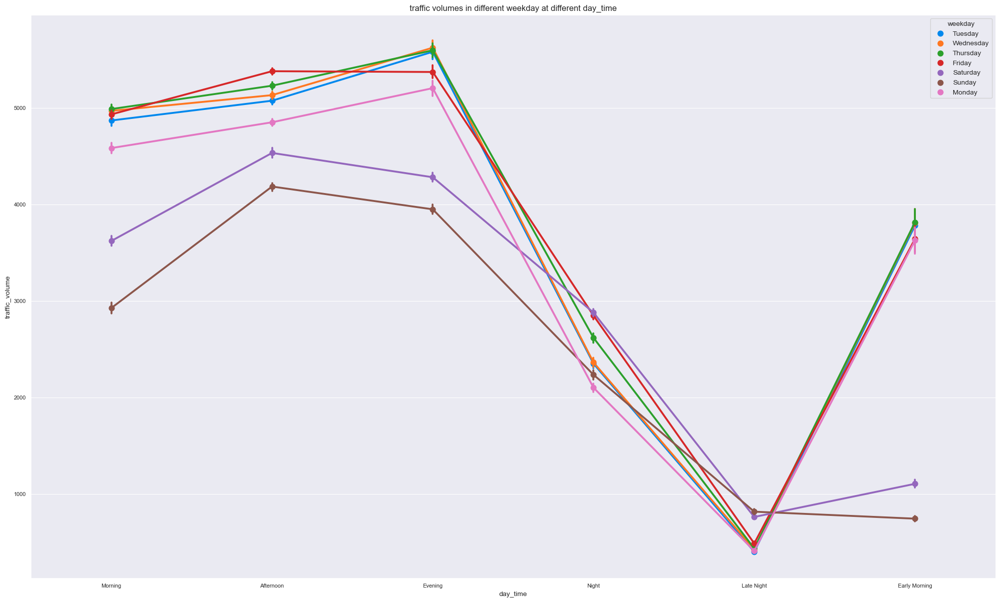

In [140]:
plt.figure(figsize = (25,15))
sns.pointplot(x=  'day_time', y = 'traffic_volume', hue = 'weekday' , data = data)
plt.title("traffic volumes in different weekday at different day_time") 

In [141]:
data.loc[data.rain_1h>2000,'rain_1h'] = np.nan
data['rain_1h'].fillna(method='ffill',inplace=True)

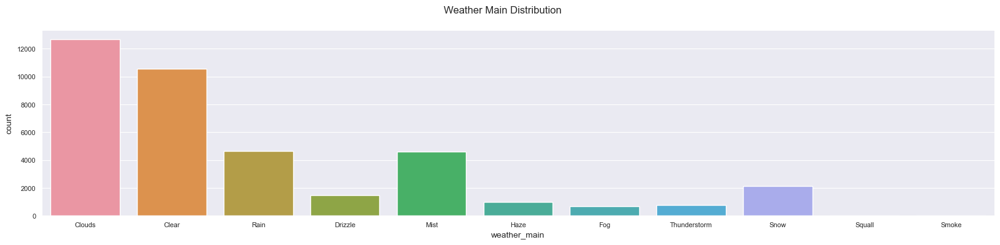

In [142]:
fig, ax = plt.subplots(figsize=(20,4))
fig.suptitle('Weather Main Distribution')

sns.countplot(x=data['weather_main'])

plt.show()

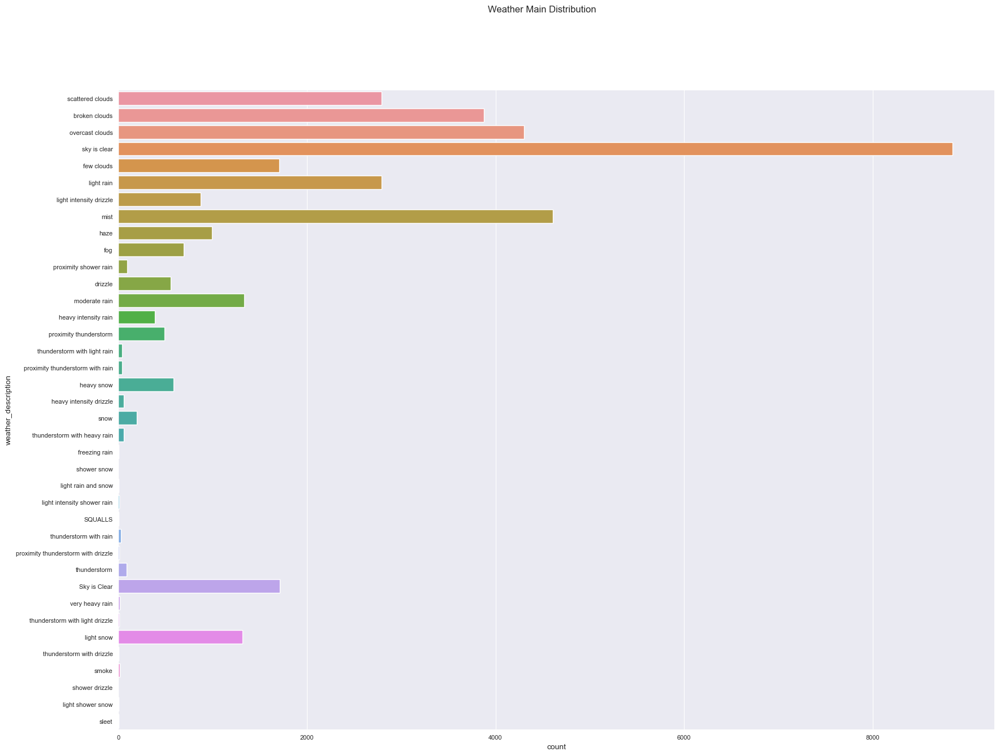

In [143]:
fig, ax = plt.subplots(figsize=(20,15))
fig.suptitle('Weather Main Distribution')

sns.countplot(y=data['weather_description'])

plt.show()

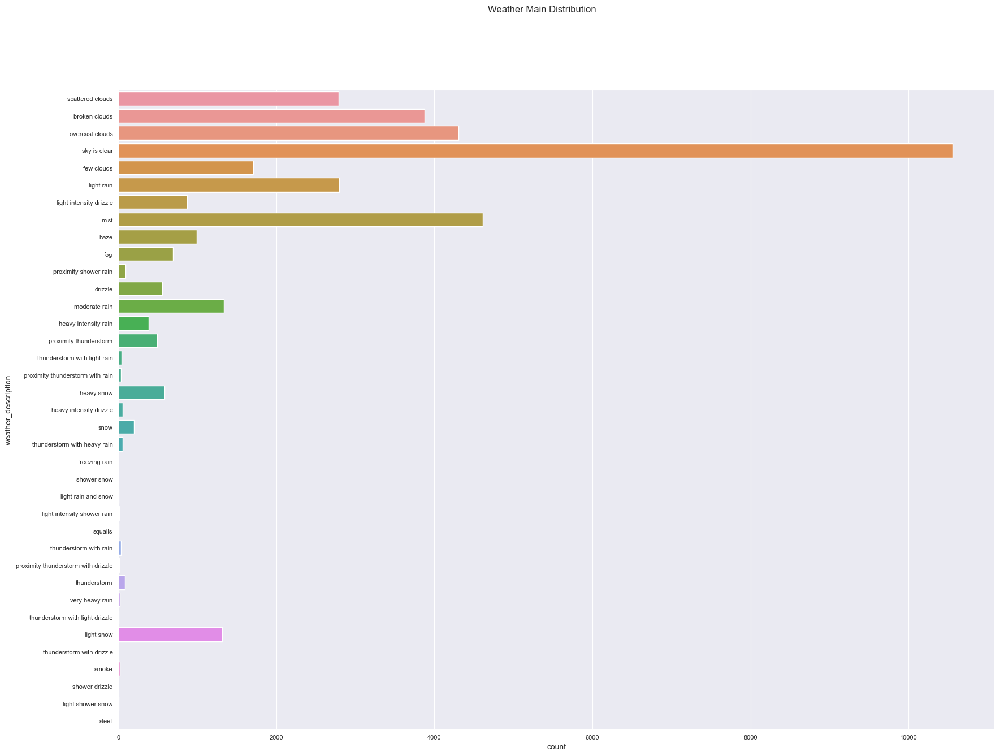

In [144]:
data['weather_description'] = data['weather_description'].map(lambda x: x.lower())

fig, ax = plt.subplots(figsize=(20,15))
fig.suptitle('Weather Main Distribution')

sns.countplot(y=data['weather_description'])

plt.show()

In [145]:
data.groupby(['weather_main','weather_description']).aggregate({'hour':'count','traffic_volume':'mean'}).reset_index().style.background_gradient(cmap='Reds')

,weather_main,weather_description,hour,traffic_volume
0,Clear,sky is clear,10560,3085.865909
1,Clouds,broken clouds,3879,3564.464037
2,Clouds,few clouds,1708,3619.433255
3,Clouds,overcast clouds,4302,3339.694561
4,Clouds,scattered clouds,2791,3875.658904
5,Drizzle,drizzle,554,3073.518051
6,Drizzle,heavy intensity drizzle,56,3206.375000
7,Drizzle,light intensity drizzle,871,3338.663605
8,Drizzle,shower drizzle,1,2010.000000
9,Fog,fog,693,2833.751804


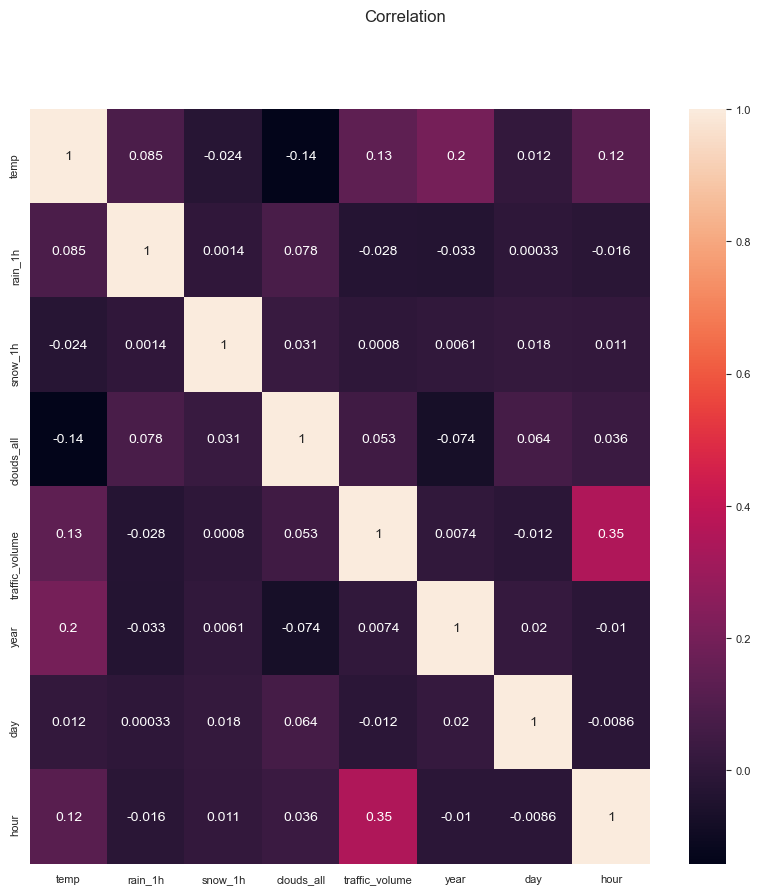

In [146]:
fig, ax = plt.subplots(figsize=(10,10))
fig.suptitle('Correlation')

sns.heatmap(data.corr(),annot=True)

plt.show()

In [147]:
train=data.reset_index(drop=True)

In [148]:
train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,year,day,month,weekday,hour,day_time
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,2012,2,October,Tuesday,9,Morning
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,2012,2,October,Tuesday,10,Morning
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,2012,2,October,Tuesday,11,Morning
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,2012,2,October,Tuesday,12,Afternoon
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,2012,2,October,Tuesday,13,Afternoon


#

<h1>Preprocessing data

In [3]:
raw=pd.read_csv('Train.csv')
raw['date_time'] = pd.to_datetime(raw['date_time'])
train = raw.reset_index(drop=True)
train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
0,2012-10-02 09:00:00,None,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
1,2012-10-02 10:00:00,None,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2,2012-10-02 11:00:00,None,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
3,2012-10-02 12:00:00,None,290.13,0.0,0.0,90,Clouds,overcast clouds,5026
4,2012-10-02 13:00:00,None,291.14,0.0,0.0,75,Clouds,broken clouds,4918


In [4]:
def getLastDayValue(df, feature, n_days=1):
    
    for days in range(1,n_days+1):
        past_days = (df.date_time - timedelta(days=days)).values
        col = f'{feature}_{days}_days_before'
        past_days_in_df = df.loc[df.date_time.isin(past_days),'date_time']
        past_days_value = df.loc[df.date_time.isin(past_days),feature].values
        
        mapping = dict(zip((past_days_in_df+timedelta(days=days)).values, past_days_value))
        
        df[col] = df['date_time'].map(mapping)
        
    return df

In [5]:
def getNextDayValue(df, feature, n_days=1):
    
    for days in range(1,n_days+1):
        past_days = (df.date_time + timedelta(days=days)).values
        col = f'{feature}_{days}_days_after'
        past_days_in_df = df.loc[df.date_time.isin(past_days),'date_time']
        past_days_value = df.loc[df.date_time.isin(past_days),feature].values
        
        mapping = dict(zip((past_days_in_df-timedelta(days=days)).values, past_days_value))
        
        df[col] = df['date_time'].map(mapping)
        
    return df

In [6]:
def getLastHourValue(df, feature, n_hours=1):
    
    for hours in range(1,n_hours+1):
        past_hours = (df.date_time - timedelta(hours=hours)).values
        col = f'{feature}_{hours}_hours_before'
        past_hours_in_df = df.loc[df.date_time.isin(past_hours),'date_time']
        past_hours_value = df.loc[df.date_time.isin(past_hours),feature].values
        
        mapping = dict(zip((past_hours_in_df+timedelta(hours=hours)).values, past_hours_value))
        
        df[col] = df['date_time'].map(mapping)
        
    return df

In [7]:
### Holiday ###

def preprocessHoliday(df):
    
    """Marking All the samples collected on a Holiday as its respective Holiday.
    Because only one sample is marked as a Holiday for all Holidays in the raw data.
    For Ex: if there is a Holiday on 2012-02-08 then sample with date_time=2012-02-08 00:00:00 is marked as a Holiday"""
    
    isHoliday = df.holiday!='None'
    date = df.date_time[isHoliday].dt.date.values
    holiday = df.holiday[isHoliday].values

    mapping = dict(zip(date,holiday))

    df['holiday'] = df['date_time'].dt.date.map(mapping)
    df.loc[df['holiday'].isna(),'holiday'] = 'Work Day'

    return df

In [8]:
train = preprocessHoliday(train)
test=pd.read_csv('Test.csv')
test=test.reset_index(drop=True)
test['date_time'] = pd.to_datetime(test['date_time'])
test=preprocessHoliday(test)

In [9]:
train.head(3)

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767


In [10]:
isHoliday = lambda x: 0 if x == 'Work Day' else 1
train['isHoliday'] = train['holiday'].map(isHoliday)
test['isHoliday'] = test['holiday'].map(isHoliday)

In [11]:
def getWasYesterdayAHoliday(df):
    
    past_days = (df.date_time - timedelta(days=1)).dt.date.values
    col = 'yesterdayHoliday'
    past_days_in_df = df.loc[df.date_time.dt.date.isin(past_days),'date_time']
    past_days_value = df.loc[df.date_time.dt.date.isin(past_days),'isHoliday'].values

    mapping = dict(zip((past_days_in_df+timedelta(days=1)).dt.date.values, past_days_value))

    df[col] = df['date_time'].dt.date.map(mapping)
    
    return df

In [12]:
train = getWasYesterdayAHoliday(train)
test = getWasYesterdayAHoliday(test)

In [13]:
def getIsTomorrowAHoliday(df):

    past_days = (df.date_time + timedelta(days=1)).dt.date.values
    col = 'tomorrowHoliday'
    past_days_in_df = df.loc[df.date_time.dt.date.isin(past_days),'date_time']
    past_days_value = df.loc[df.date_time.dt.date.isin(past_days),'isHoliday'].values

    mapping = dict(zip((past_days_in_df-timedelta(days=1)).dt.date.values, past_days_value))

    df[col] = df['date_time'].dt.date.map(mapping)
    
    return df

train = getIsTomorrowAHoliday(train)
test = getIsTomorrowAHoliday(test)

train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,yesterdayHoliday,tomorrowHoliday
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,NaN,0.0
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,NaN,0.0
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,NaN,0.0
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,NaN,0.0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,NaN,0.0


In [14]:
train.loc[train.temp==0,'temp'] = np.nan
train.temp.fillna(method='ffill',inplace=True)

### Last few day's temperature at this time? ###
train = getLastDayValue(train, feature = 'temp')
test = getLastDayValue(test, feature = 'temp')

### Last few hour's temperature? ###
train = getLastHourValue(train, feature = 'temp', n_hours=3)
test = getLastHourValue(test, feature = 'temp', n_hours=3)

train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,yesterdayHoliday,tomorrowHoliday,temp_1_days_before,temp_1_hours_before,temp_2_hours_before,temp_3_hours_before
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,NaN,0.0,NaN,NaN,NaN,NaN
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,NaN,0.0,NaN,288.28,NaN,NaN
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,NaN,0.0,NaN,289.36,288.28,NaN
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,NaN,0.0,NaN,289.58,289.36,288.28
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,NaN,0.0,NaN,290.13,289.58,289.36


In [15]:
train[train.rain_1h>1000]

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,yesterdayHoliday,tomorrowHoliday,temp_1_days_before,temp_1_hours_before,temp_2_hours_before,temp_3_hours_before
24872,2016-07-11 17:00:00,Work Day,302.11,9831.3,0.0,75,Rain,very heavy rain,5535,0,0.0,0.0,299.97,301.48,300.81,300.18


In [16]:
train[train.date_time.dt.date.isin(train.loc[train.rain_1h>1000,'date_time'].dt.date.values)]

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,yesterdayHoliday,tomorrowHoliday,temp_1_days_before,temp_1_hours_before,temp_2_hours_before,temp_3_hours_before
24855,2016-07-11 00:00:00,Work Day,296.22,0.00,0.0,90,Clouds,overcast clouds,621,0,0.0,0.0,294.08,296.26,296.44,296.88
24856,2016-07-11 01:00:00,Work Day,295.80,0.00,0.0,90,Clouds,overcast clouds,376,0,0.0,0.0,294.52,296.22,296.26,296.44
24857,2016-07-11 02:00:00,Work Day,295.62,0.00,0.0,90,Clouds,overcast clouds,291,0,0.0,0.0,294.40,295.80,296.22,296.26
24858,2016-07-11 03:00:00,Work Day,295.24,0.00,0.0,75,Clouds,broken clouds,342,0,0.0,0.0,294.39,295.62,295.80,296.22
24859,2016-07-11 04:00:00,Work Day,295.40,0.00,0.0,75,Clouds,broken clouds,848,0,0.0,0.0,294.36,295.24,295.62,295.80
24860,2016-07-11 05:00:00,Work Day,295.37,0.00,0.0,75,Clouds,broken clouds,2780,0,0.0,0.0,293.07,295.40,295.24,295.62
24861,2016-07-11 06:00:00,Work Day,295.05,0.00,0.0,90,Rain,light rain,5211,0,0.0,0.0,291.79,295.37,295.40,295.24
24862,2016-07-11 07:00:00,Work Day,294.99,0.00,0.0,75,Rain,light rain,5803,0,0.0,0.0,291.53,295.05,295.37,295.40
24863,2016-07-11 08:00:00,Work Day,294.83,0.00,0.0,90,Rain,light rain,5157,0,0.0,0.0,291.74,294.99,295.05,295.37
24864,2016-07-11 09:00:00,Work Day,294.79,0.00,0.0,90,Clouds,overcast clouds,4016,0,0.0,0.0,292.11,294.83,294.99,295.05


In [17]:
train.loc[train.rain_1h>1000,'rain_1h'] = np.nan
train.rain_1h.fillna(method='ffill',inplace=True)

### Last few hour's rain? ###
train = getLastHourValue(train, feature = 'rain_1h', n_hours=3)
test = getLastHourValue(test, feature = 'rain_1h', n_hours=3)

### Last few hour's snow? ###
train = getLastHourValue(train, feature = 'snow_1h', n_hours=3)
test = getLastHourValue(test, feature = 'snow_1h', n_hours=3)

train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,...,temp_1_days_before,temp_1_hours_before,temp_2_hours_before,temp_3_hours_before,rain_1h_1_hours_before,rain_1h_2_hours_before,rain_1h_3_hours_before,snow_1h_1_hours_before,snow_1h_2_hours_before,snow_1h_3_hours_before
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,...,NaN,288.28,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,...,NaN,289.36,288.28,NaN,0.0,0.0,NaN,0.0,0.0,NaN
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,...,NaN,289.58,289.36,288.28,0.0,0.0,0.0,0.0,0.0,0.0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,...,NaN,290.13,289.58,289.36,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
train = getLastHourValue(train, feature = 'clouds_all', n_hours=3)
test = getLastHourValue(test, feature = 'clouds_all', n_hours=3)

train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,...,temp_3_hours_before,rain_1h_1_hours_before,rain_1h_2_hours_before,rain_1h_3_hours_before,snow_1h_1_hours_before,snow_1h_2_hours_before,snow_1h_3_hours_before,clouds_all_1_hours_before,clouds_all_2_hours_before,clouds_all_3_hours_before
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,...,NaN,0.0,NaN,NaN,0.0,NaN,NaN,40.0,NaN,NaN
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,...,NaN,0.0,0.0,NaN,0.0,0.0,NaN,75.0,40.0,NaN
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,...,288.28,0.0,0.0,0.0,0.0,0.0,0.0,90.0,75.0,40.0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,...,289.36,0.0,0.0,0.0,0.0,0.0,0.0,90.0,90.0,75.0


In [19]:
def getDateTimeFeatures(df):
    df['day'] = df.date_time.dt.day
    df['month'] = df.date_time.dt.month
    df['year'] = df.date_time.dt.year
    df['weekday'] = df.date_time.dt.weekday  # Monday is denoted by 0 and Sunday is denoted by 6
    df['hour'] = df.date_time.dt.hour
    
    # Binning hour feature
    def getDayTime(hour):

        if hour<4:
            return "Late Night"
        elif hour<8:
            return "Early Morning"
        elif hour<12:
            return "Morning"
        elif hour<16:
            return "Afternoon"
        elif hour<19:
            return "Evening"
        elif hour<24:
            return "Night"

    df['day_time'] = df['hour'].map(getDayTime)
    
    df['is_weekend'] = df['weekday'].map(lambda x: 1 if x in ['Sunday','Saturday'] else 0)
    
    return df
train = getDateTimeFeatures(train)
test = getDateTimeFeatures(test)

train.head(5)

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,...,clouds_all_1_hours_before,clouds_all_2_hours_before,clouds_all_3_hours_before,day,month,year,weekday,hour,day_time,is_weekend
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,...,NaN,NaN,NaN,2,10,2012,1,9,Morning,0
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,...,40.0,NaN,NaN,2,10,2012,1,10,Morning,0
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,...,75.0,40.0,NaN,2,10,2012,1,11,Morning,0
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,...,90.0,75.0,40.0,2,10,2012,1,12,Afternoon,0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,...,90.0,90.0,75.0,2,10,2012,1,13,Afternoon,0


In [20]:
numeric = train.select_dtypes(exclude='object').copy()
for col in numeric.columns[numeric.isna().any(axis=0)]:
    
    train[f'unknown_{col}'] = 0
    train.loc[train[col].isna(),f'unknown_{col}'] = 1
    train.loc[train[col].isna(), col] = -1
    
    test[f'unknown_{col}'] = 0
    test.loc[test[col].isna(),f'unknown_{col}'] = 1
    test.loc[test[col].isna(), col] = -1
cate = train.select_dtypes(include='object').copy()
for col in cate.columns[cate.isna().any(axis=0)]:
    
    train[f'unknown_{col}'] = 0
    train.loc[train[col].isna(),f'unknown_{col}'] = 1
    train.loc[train[col].isna(), col] = 'Missing'
    
    test[f'unknown_{col}'] = 0
    test.loc[test[col].isna(),f'unknown_{col}'] = 1
    test.loc[test[col].isna(), col] = 'Missing'

train.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,isHoliday,...,unknown_temp_3_hours_before,unknown_rain_1h_1_hours_before,unknown_rain_1h_2_hours_before,unknown_rain_1h_3_hours_before,unknown_snow_1h_1_hours_before,unknown_snow_1h_2_hours_before,unknown_snow_1h_3_hours_before,unknown_clouds_all_1_hours_before,unknown_clouds_all_2_hours_before,unknown_clouds_all_3_hours_before
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,0,...,1,1,1,1,1,1,1,1,1,1
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,broken clouds,4516,0,...,1,0,1,1,0,1,1,0,1,1
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,0,...,1,0,0,1,0,0,1,0,0,1
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,0,...,0,0,0,0,0,0,0,0,0,0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,broken clouds,4918,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
X = train.drop(['traffic_volume'],axis=1).copy()
y = train['traffic_volume'].copy().astype(np.float32)

In [22]:
def rmse(y_true,y_pred):
    return np.sqrt(np.mean((y_true-y_pred)**2))

### Mean Absolute Error ###
def mae(y_true, y_pred):
    return np.mean(np.abs(y_true-y_pred))

In [23]:
X.shape

(38563, 46)

In [24]:
test.shape

(9641, 46)

In [25]:
X.drop(['weather_description'],axis=1,inplace=True)

In [26]:
test.drop(['weather_description'],axis=1,inplace=True)

In [27]:
print(X.shape)
print(test.shape)

(38563, 45)
(9641, 45)


In [28]:
X.head()

,date_time,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,isHoliday,yesterdayHoliday,tomorrowHoliday,...,unknown_temp_3_hours_before,unknown_rain_1h_1_hours_before,unknown_rain_1h_2_hours_before,unknown_rain_1h_3_hours_before,unknown_snow_1h_1_hours_before,unknown_snow_1h_2_hours_before,unknown_snow_1h_3_hours_before,unknown_clouds_all_1_hours_before,unknown_clouds_all_2_hours_before,unknown_clouds_all_3_hours_before
0,2012-10-02 09:00:00,Work Day,288.28,0.0,0.0,40,Clouds,0,-1.0,0.0,...,1,1,1,1,1,1,1,1,1,1
1,2012-10-02 10:00:00,Work Day,289.36,0.0,0.0,75,Clouds,0,-1.0,0.0,...,1,0,1,1,0,1,1,0,1,1
2,2012-10-02 11:00:00,Work Day,289.58,0.0,0.0,90,Clouds,0,-1.0,0.0,...,1,0,0,1,0,0,1,0,0,1
3,2012-10-02 12:00:00,Work Day,290.13,0.0,0.0,90,Clouds,0,-1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,2012-10-02 13:00:00,Work Day,291.14,0.0,0.0,75,Clouds,0,-1.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
X.drop(['holiday'],axis=1,inplace=True)

In [30]:
test.drop(['holiday'],axis=1,inplace=True)

In [31]:
print(X.shape)
print(test.shape)

(38563, 44)
(9641, 44)


In [32]:
X.head()

,date_time,temp,rain_1h,snow_1h,clouds_all,weather_main,isHoliday,yesterdayHoliday,tomorrowHoliday,temp_1_days_before,...,unknown_temp_3_hours_before,unknown_rain_1h_1_hours_before,unknown_rain_1h_2_hours_before,unknown_rain_1h_3_hours_before,unknown_snow_1h_1_hours_before,unknown_snow_1h_2_hours_before,unknown_snow_1h_3_hours_before,unknown_clouds_all_1_hours_before,unknown_clouds_all_2_hours_before,unknown_clouds_all_3_hours_before
0,2012-10-02 09:00:00,288.28,0.0,0.0,40,Clouds,0,-1.0,0.0,-1.0,...,1,1,1,1,1,1,1,1,1,1
1,2012-10-02 10:00:00,289.36,0.0,0.0,75,Clouds,0,-1.0,0.0,-1.0,...,1,0,1,1,0,1,1,0,1,1
2,2012-10-02 11:00:00,289.58,0.0,0.0,90,Clouds,0,-1.0,0.0,-1.0,...,1,0,0,1,0,0,1,0,0,1
3,2012-10-02 12:00:00,290.13,0.0,0.0,90,Clouds,0,-1.0,0.0,-1.0,...,0,0,0,0,0,0,0,0,0,0
4,2012-10-02 13:00:00,291.14,0.0,0.0,75,Clouds,0,-1.0,0.0,-1.0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
X['weather_main'].unique()

array(['Clouds', 'Clear', 'Rain', 'Drizzle', 'Mist', 'Haze', 'Fog',
       'Thunderstorm', 'Snow', 'Squall', 'Smoke'], dtype=object)

In [34]:
pd.get_dummies(X['weather_main'], prefix='weather',dummy_na=True)

,weather_Clear,weather_Clouds,weather_Drizzle,weather_Fog,weather_Haze,weather_Mist,weather_Rain,weather_Smoke,weather_Snow,weather_Squall,weather_Thunderstorm,weather_nan
0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
38558,0,0,0,0,0,0,0,0,1,0,0,0
38559,0,0,1,0,0,0,0,0,0,0,0,0
38560,0,0,0,0,0,1,0,0,0,0,0,0
38561,0,0,0,0,0,0,1,0,0,0,0,0


In [35]:
X_df = pd.concat([X,pd.get_dummies(X['weather_main'], prefix='weather',dummy_na=True)],axis=1).drop(['weather_main'],axis=1)

In [36]:
pd.get_dummies(test['weather_main'], prefix='weather',dummy_na=True)

,weather_Clear,weather_Clouds,weather_Drizzle,weather_Fog,weather_Haze,weather_Mist,weather_Rain,weather_Smoke,weather_Snow,weather_Thunderstorm,weather_nan
0,0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
9636,0,1,0,0,0,0,0,0,0,0,0
9637,0,1,0,0,0,0,0,0,0,0,0
9638,0,0,0,0,0,0,0,0,0,1,0
9639,0,1,0,0,0,0,0,0,0,0,0


In [37]:
test_df = pd.concat([test,pd.get_dummies(test['weather_main'], prefix='weather',dummy_na=True)],axis=1).drop(['weather_main'],axis=1)

In [38]:
print(X_df.shape)
print(test_df.shape)

(38563, 55)
(9641, 54)


In [39]:
X_df.drop(['weather_Squall'],axis=1,inplace=True)

In [40]:
X_df.head()

,date_time,temp,rain_1h,snow_1h,clouds_all,isHoliday,yesterdayHoliday,tomorrowHoliday,temp_1_days_before,temp_1_hours_before,...,weather_Clouds,weather_Drizzle,weather_Fog,weather_Haze,weather_Mist,weather_Rain,weather_Smoke,weather_Snow,weather_Thunderstorm,weather_nan
0,2012-10-02 09:00:00,288.28,0.0,0.0,40,0,-1.0,0.0,-1.0,-1.00,...,1,0,0,0,0,0,0,0,0,0
1,2012-10-02 10:00:00,289.36,0.0,0.0,75,0,-1.0,0.0,-1.0,288.28,...,1,0,0,0,0,0,0,0,0,0
2,2012-10-02 11:00:00,289.58,0.0,0.0,90,0,-1.0,0.0,-1.0,289.36,...,1,0,0,0,0,0,0,0,0,0
3,2012-10-02 12:00:00,290.13,0.0,0.0,90,0,-1.0,0.0,-1.0,289.58,...,1,0,0,0,0,0,0,0,0,0
4,2012-10-02 13:00:00,291.14,0.0,0.0,75,0,-1.0,0.0,-1.0,290.13,...,1,0,0,0,0,0,0,0,0,0


In [41]:
test.drop(['date_time'],axis=1,inplace=True)
X.drop(['date_time'],axis=1,inplace=True)

In [42]:
X_df.shape

(38563, 54)

In [43]:
pd.get_dummies(X_df['day_time'], prefix='day',dummy_na=True)

,day_Afternoon,day_Early Morning,day_Evening,day_Late Night,day_Morning,day_Night,day_nan
0,0,0,0,0,1,0,0
1,0,0,0,0,1,0,0
2,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...
38558,0,0,1,0,0,0,0
38559,0,0,0,0,0,1,0
38560,0,0,0,0,0,1,0
38561,0,0,0,0,0,1,0


In [44]:
X_df = pd.concat([X_df,pd.get_dummies(X_df['day_time'], prefix='day',dummy_na=True)],axis=1).drop(['day_time'],axis=1)

In [45]:
X_df.shape

(38563, 60)

In [46]:
pd.get_dummies(test_df['day_time'], prefix='day',dummy_na=True)

,day_Afternoon,day_Early Morning,day_Evening,day_Late Night,day_Morning,day_Night,day_nan
0,0,0,0,0,0,1,0
1,0,0,0,0,0,1,0
2,0,0,0,0,0,1,0
3,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...
9636,0,0,0,0,0,1,0
9637,0,0,0,0,0,1,0
9638,0,0,0,0,0,1,0
9639,0,0,0,0,0,1,0


In [47]:
test_df = pd.concat([test_df,pd.get_dummies(test_df['day_time'], prefix='day',dummy_na=True)],axis=1).drop(['day_time'],axis=1)

In [48]:
X_df.shape

(38563, 60)

In [49]:
test_df.shape

(9641, 60)

In [50]:
print(X_df.shape)
print(test_df.shape)

(38563, 60)
(9641, 60)


In [51]:
X_df.drop(['date_time'],axis=1,inplace=True)
test_df.drop(['date_time'],axis=1,inplace=True)

In [52]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38563 entries, 0 to 38562
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   temp                               38563 non-null  float64
 1   rain_1h                            38563 non-null  float64
 2   snow_1h                            38563 non-null  float64
 3   clouds_all                         38563 non-null  int64  
 4   isHoliday                          38563 non-null  int64  
 5   yesterdayHoliday                   38563 non-null  float64
 6   tomorrowHoliday                    38563 non-null  float64
 7   temp_1_days_before                 38563 non-null  float64
 8   temp_1_hours_before                38563 non-null  float64
 9   temp_2_hours_before                38563 non-null  float64
 10  temp_3_hours_before                38563 non-null  float64
 11  rain_1h_1_hours_before             38563 non-null  flo

In [53]:
from sklearn.ensemble import RandomForestRegressor
RF=RandomForestRegressor(bootstrap= True, ccp_alpha= 0.0, criterion= 'mse', max_depth= None, max_features= 0.8, max_leaf_nodes= None, max_samples= 0.8, min_impurity_decrease= 0.0, min_impurity_split=None, min_samples_leaf=5, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1, oob_score=False, random_state=42, verbose=0, warm_start= False)

In [566]:
RF.fit(X_df,y)

RandomForestRegressor(max_features=0.8, max_samples=0.8, min_samples_leaf=5,
                      min_samples_split=10, n_jobs=-1, random_state=42)

In [567]:
pr=RF.predict(test_df)

In [568]:
pr[0]

2587.8154193143455

In [ ]:
import xgboost as xgb
regressor=xgb.XGBRegressor()
booster=['gbtree','gblinear']
base_score=[0.25,0.5,0.75,1]
n_estimators = [100, 500, 900, 1100, 1500]
max_depth = [2, 3, 5, 10, 15]
booster=['gbtree','gblinear']
learning_rate=[0.05,0.1,0.15,0.20]
min_child_weight=[1,2,3,4]

# Define the grid of hyperparameters to search
hyperparameter_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'min_child_weight':min_child_weight,
    'booster':booster,
    'base_score':base_score
    }
from sklearn.model_selection import RandomizedSearchCV
random_cv = RandomizedSearchCV(estimator=regressor,
            param_distributions=hyperparameter_grid,
            cv=5, n_iter=50,
            scoring = 'neg_mean_absolute_error',n_jobs = 4,
            verbose = 5, 
            return_train_score = True,
            random_state=42)
random_cv.fit(X_df,y)


In [ ]:
random_cv.best_estimator_

In [ ]:
xgreg=xgb.XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=10,
             min_child_weight=3, missing=np.nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [384]:
xgreg.fit(X_df,y)

XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=10,
             min_child_weight=3, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [385]:
y_pred=xgreg.predict(test_df)

In [388]:
y_pred[0]

2566.1528

In [390]:
tr=pd.DataFrame({
    'Values':pr
})
tr.to_csv('RF_out.csv',index=True)

In [77]:
from tensorflow import keras
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch
def build_model(hp):
    model = keras.Sequential()
    for i in range(hp.Int('num_layers', 2, 20)):
        model.add(layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=32,
                                            max_value=512,
                                            step=32),
                               activation='relu'))
    model.add(layers.Dense(1, activation='linear'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mean_absolute_error',
        metrics=['mean_absolute_error'])
    return model

import os
tuner = RandomSearch(
    build_model,
    objective='val_mean_absolute_error',
    max_trials=5,
    executions_per_trial=3,
    directory=os.path.normpath('C:/'),
    project_name='traffic volume2')

INFO:tensorflow:Reloading Oracle from existing project C:\traffic volume2\oracle.json
INFO:tensorflow:Reloading Tuner from C:\traffic volume2\tuner0.json


In [392]:
tuner.search_space_summary()

Search space summary
Default search space size: 4
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 20, 'step': 1, 'sampling': None}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [393]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_df, y, test_size=0.1, random_state=0)

In [395]:
tuner.search(X_train, y_train,
             epochs=40,
             validation_data=(X_test, y_test))

Trial 6 Complete [00h 06m 33s]
val_mean_absolute_error: 311.48248291015625

Best val_mean_absolute_error So Far: 311.48248291015625
Total elapsed time: 00h 28m 25s
INFO:tensorflow:Oracle triggered exit


In [396]:
tuner.results_summary()

Results summary
Results in C:\traffic volume2
Showing 10 best trials
Objective(name='val_mean_absolute_error', direction='min')
Trial summary
Hyperparameters:
num_layers: 8
units_0: 416
units_1: 192
learning_rate: 0.001
units_2: 64
units_3: 384
units_4: 256
units_5: 224
units_6: 96
units_7: 448
units_8: 128
units_9: 320
units_10: 320
units_11: 224
units_12: 480
units_13: 320
Score: 311.48248291015625
Trial summary
Hyperparameters:
num_layers: 4
units_0: 128
units_1: 192
learning_rate: 0.001
units_2: 32
units_3: 32
Score: 345.4068603515625
Trial summary
Hyperparameters:
num_layers: 5
units_0: 224
units_1: 288
learning_rate: 0.0001
units_2: 384
units_3: 192
units_4: 96
units_5: 320
units_6: 96
units_7: 224
Score: 534.2568969726562
Trial summary
Hyperparameters:
num_layers: 8
units_0: 416
units_1: 192
learning_rate: 0.01
units_2: 352
units_3: 512
units_4: 32
units_5: 32
units_6: 32
units_7: 32
Score: 552.9955647786459
Trial summary
Hyperparameters:
num_layers: 14
units_0: 352
units_1: 160

In [397]:
from tensorflow.keras import backend as K
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [400]:
import tensorflow
from tensorflow import keras
from tensorflow.keras.layers import Dense
# Initialising the ANN
classifier = tensorflow.keras.Sequential()

# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 128,kernel_initializer='he_uniform',activation='relu',input_dim = 59))

# Adding the second hidden layer
classifier.add(Dense(units = 416, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 192, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 64, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 384, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 256, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 416, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 224, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 96, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 448, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 128, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 320, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 224, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 480, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 320, kernel_initializer = 'he_uniform',activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1, kernel_initializer = 'he_uniform', activation = 'linear'))

from tensorflow.keras.optimizers import Adam
opt=Adam(0.001)
# Compiling the ANN
classifier.compile(optimizer =opt, loss = root_mean_squared_error)

In [401]:
model_history=classifier.fit(X_df, y,validation_split=0.20, batch_size = 10, epochs = 20)

Epoch 1/20
3085/3085 [==============================] - 15s 5ms/step - loss: 2056.4169 - val_loss: 1473.4447
Epoch 2/20
3085/3085 [==============================] - 15s 5ms/step - loss: 1505.6940 - val_loss: 1013.7050
Epoch 3/20
3085/3085 [==============================] - 15s 5ms/step - loss: 1095.3258 - val_loss: 1401.8423
Epoch 4/20
3085/3085 [==============================] - 15s 5ms/step - loss: 1024.0867 - val_loss: 806.0040
Epoch 5/20
3085/3085 [==============================] - 15s 5ms/step - loss: 969.5723 - val_loss: 828.7491
Epoch 6/20
3085/3085 [==============================] - 17s 5ms/step - loss: 951.2166 - val_loss: 948.1044
Epoch 7/20
3085/3085 [==============================] - 16s 5ms/step - loss: 931.4168 - val_loss: 897.5654
Epoch 8/20
3085/3085 [==============================] - 15s 5ms/step - loss: 913.1956 - val_loss: 783.6357
Epoch 9/20
3085/3085 [==============================] - 15s 5ms/step - loss: 891.6628 - val_loss: 856.4600
Epoch 10/20
3085/3085 [=======

In [403]:
nn=classifier.predict(test_df)

In [424]:
nn[0]

2319.352783203125

In [412]:
sub6 = pd.DataFrame({
        
        "Values": nn
    })
sub6.to_csv('nn_out.csv', index=True)

#
<p1>LSTM

In [428]:
import tensorflow
from tensorflow import keras
from tensorflow.keras.layers import LSTM

In [443]:
from xgboost import XGBRegressor

In [509]:
ttt=pd.read_csv('Train.csv')

In [510]:
pp=ttt['traffic_volume']

In [511]:
pp.shape

(38563,)

In [570]:
from sklearn.datasets import load_diabetes
from sklearn.linear_model import RidgeCV
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
X,ty = load_diabetes(return_X_y=True)
estimators = [
     ('lr', RidgeCV()),
     ('svr', LinearSVR(random_state=42),
     ('xgb',XGBRegressor()))
     
 ]
reg = StackingRegressor(
     estimators=estimators,
     final_estimator=RandomForestRegressor(n_estimators=10,
                                           random_state=42)
 )
reg.fit(X_df,y)

StackingRegressor(estimators=[('lr', RidgeCV(alphas=array([ 0.1,  1. , 10. ]))),
                              ('svr', LinearSVR(random_state=42),
                               ('xgb',
                                XGBRegressor(base_score=None, booster=None,
                                             colsample_bylevel=None,
                                             colsample_bynode=None,
                                             colsample_bytree=None, gamma=None,
                                             gpu_id=None,
                                             importance_type='gain',
                                             interaction_constraints=None,
                                             learning_rate=None,
                                             max_delta_step=None,
                                             max_depth=None,
                                             min_child_weight=None, missing=nan,
                                             m

In [572]:
dd=reg.predict(test_df)

In [576]:
w1=0.2  
w2=0.7 # high for Xg boost as it is hyperparameter tuned and as it focuses on both bias and variance when comared to RandomForest
w3=0.1 #low for neural network as the loss is high
final_pred=((w1*pr)+(w2*y_pred)+(w3*nn))

In [577]:
final_pred[0]

2545.805369019119

In [578]:
sub6 = pd.DataFrame({
        
        "Values": nn
    })
sub6.to_csv('output.csv', index=True)

In [55]:
from statsmodels.tsa.stattools import adfuller

In [56]:
test_result=adfuller(y)

In [57]:
def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [58]:
df['Sales First Difference'] = df['Sales'] - df['Sales'].shift(1)adfuller_test(y)

ADF Test Statistic : -25.389677278621722
p-value : 0.0
#Lags Used : 48
Number of Observations Used : 38514
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:>

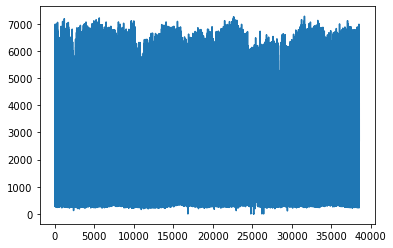

In [60]:
y.plot()

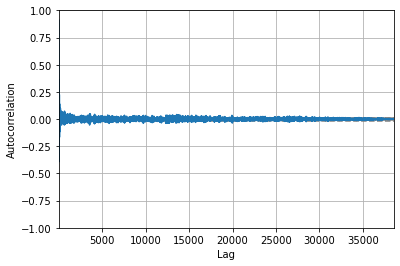

In [62]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(y)
plt.show()

In [63]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

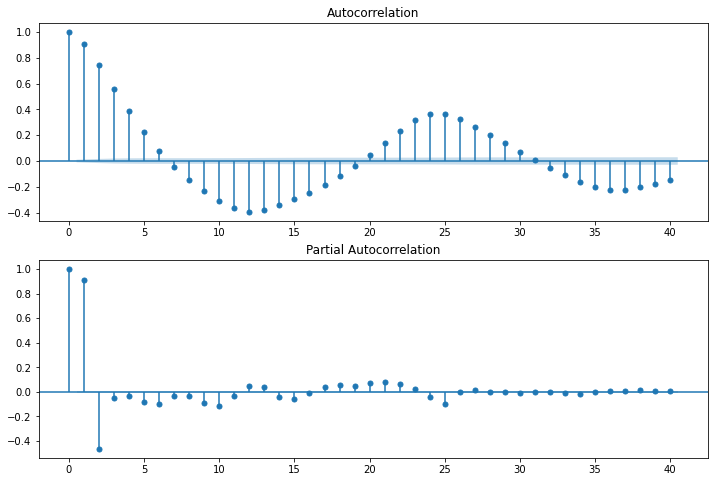

In [65]:
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(y.iloc[13:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(y.iloc[13:],lags=40,ax=ax2)

In [66]:
from statsmodels.tsa.arima_model import ARIMA

In [67]:
model=ARIMA(y,order=(1,1,1))
model_fit=model.fit()

In [68]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:       D.traffic_volume   No. Observations:                38562
Model:                 ARIMA(1, 1, 1)   Log Likelihood             -311536.508
Method:                       css-mle   S.D. of innovations            780.478
Date:                Thu, 17 Dec 2020   AIC                         623081.016
Time:                        18:24:59   BIC                         623115.256
Sample:                             1   HQIC                        623091.872
                                                                              
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0.0737      6.351     -0.012      0.991     -12.522      12.375
ar.L1.D.traffic_volume     0.3028      0.011     28.645      0.000       0.282       0.324
ma.L1.D.traffic_volume     0.1141      0.011     10.667      0.000       0.093       0.135
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            3.3022           +0.0000j            3.3022            0.0000
MA.1           -8.7633           +0.0000j            8.7633            0.5000
-----------------------------------------------------------------------------
"""

In [81]:
X_df.shape

(38563, 59)

In [84]:

# univariate lstm example
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
# define model
model = keras.Sequential()
model.add(LSTM(50, activation='relu'))

model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(X_df, y, epochs=300, verbose=1)

Epoch 1/300


ValueError: in user code:

    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:805 train_function  *
        return step_function(self, iterator)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:795 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1259 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2730 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3417 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:788 run_step  **
        outputs = model.train_step(data)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:754 train_step
        y_pred = self(x, training=True)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\base_layer.py:998 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\engine\input_spec.py:219 assert_input_compatibility
        raise ValueError('Input ' + str(input_index) + ' of layer ' +

    ValueError: Input 0 of layer sequential_6 is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: (None, 59)
